# Load all routines path necessary for the FPDEM code to run (scripts/, src/ and environment path)

In [1]:
import sys
src_path = "/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src"
sys.path.append(f"{src_path}")
scripts_path = "/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/scripts"
sys.path.append(f"{scripts_path}")

# Define all parameters of FPDEM

Fill in all the parameters necessary to run this notebook.

In [3]:
model_main_path = "/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/testcases/Barotse"
model_pixc_main_path = "/work/SWOT/swotdev/swotdev/stephag/floodplain/run/testcase_Barotse"

# Pixc list (1 space blank between each file)
pixc_files = f"{model_pixc_main_path}/input/pixc/SWOT_L2_HR_PIXC_*.nc"

# PixcVec list (1 space blank between each file)ls 
pixcvec_files = f"{model_pixc_main_path}/input/pixcvec/SWOT_L2_HR_PIXCVec_*.nc"

# Output directory
output_dir = f"{model_main_path}/output_nbk"

# Output file name extension
tile_name = "15S22E"
first_date = "20210111T184700"
last_date = "20241119T180313"


# Geographical extrema of the studied region : filtering of points applied on this box
latitude_min = -15.41
latitude_max = -14.81
longitude_min = 22.6
longitude_max = 23.2


# Select model approach : 
# Bathtub ring method or a mix of bathtub and clustering and direct extraction of land
approach = 'mixed' # mixed or bathtub


# Pekel info : 
# Path and name of the Pekel occurrences file
pekel_path = "/work/datalake/static_aux/MASQUES/PEKEL/data2021/occurrence/occurrence.vrt"

# SWORD info : 
# Path to SWORD database
sword_path = "/work/SWOT/swotdev/swotpub/BD/BD_rivers/SWORD_v17/shp"
# Paths and names of hydrobasins (level1 and level2) files
hydrobasin_lv1_file = "/work/SWOT/swotdev/swotpub/BD/major_basins/HydroBASINS/level1/hybas_lev01_v1c.shp"
hydrobasin_lv2_file = "/work/SWOT/swotdev/swotpub/BD/major_basins/HydroBASINS/level2/hybas_lev02_v1c.shp"

# Swot science orbits and tiles path and filename
swot_tiles_file = "/work/SWOT/swotdev/swotdev/stephag/orbits/swot_science_hr_2.0s_4.0s_June2019-v3_swath_tile.shp"


#
# Mask
#
# To filter points around a specific lake, river, 
# or filter only points present in Pekel occurrences (1->100%; with a buffer if mask_buffer_size != 0)
# 0 : no; 1 : yes (with PLD); 2 : yes (with Pekel); 3 : yes (with Sword)
use_mask = 0
# Buffer in soil geometry (degrees)
mask_buffer_size = 0.02 # Optional parameter : only required if use_mask >= 1
# PLD info
lake_id = 0 # Optional parameter : only required if use_mask = 1
pld_path = "/work/SWOT/swotdev/swotpub/BD/BD_lakes/PLD/Nom/" # Optional parameter : only required if use_mask = 1


# Plot
plot = "yes2" # Options: no, yes1 (only for Python script), yes2 (for notebook)


#
# PIXC pre-processing
#
# Range value of the crosstrack minimum value wanted
cross_track_min = 10000.
# Minimum surface of a water body kept for FPDEM method
threshold = 100000. # Minimum surface of a water body kept for FPDEM method


#
# Clustering method params : performed on WATER_LAND labels (optional if approach='bathtub')
#
# zscore or isolation_forest
clustering_outlier_filter_method = "isolation_forest"
# kmeans, birch, hdbscan_tsne or hdbscan_umap are possible choices
clustering_method = "kmeans"
# Once the clustering is performed, all water bodies will get their contour extracted;
# Choose either the bathtub ring method (like it is already done for WATER labels) 
# or the geopandas concave hull method (might be better for small water bodies)
clustering_contour = "concavehull" # bathtub or concavehull


#
# Filtering
#
# Pekel filtering
# At the beginning of the bathy extraction,
# Filtering Dark water, all PIXC points within Pekel occurrences > {chosen value}% are kept
filtering_pekel_val_DW = 95
# At the end of the bathy extraction,
# Filter out all points within Pekel occurrences > {chosen value}% 
filtering_pekel_end = 'yes' # yes or no
filtering_pekel_end_val = 99 # Threshold occurrence value

# Quality flags for filtering
# At the beginning of the bathy extraction
# Filter sig0_qual: 'no' = do not filter; 'yes' = keep only good points (i.e., sig0_qual=0)
sig0_qual = 'yes' # yes or no
# At the end of the bathy extraction
# Select the bit threshold for each quality flag, all FPDEM/PIXC points with a bit higher than the chosen value are filtered out
classification_qual = 33554432
geolocation_qual = 33554432

# Isolated points filtering (with DBSCAN) :
# Maximum distance in degrees for two points to be considered neighbors
distance_to_neighbors = 0.001
# All points with less meighbors than the chosen value are filtered out
number_of_neighbors = 5

# Labeling water bodies :
# Remove objects smaller than or equal to chosen size
body_min_size = 2000
# Connectivity defining the neighborhood of a pixel
body_connectivity = 1


#
# Extract area / Obtain polygons for rasterisation
#
# Concave hull ratio (with geopandas)
plg_ch_ratio = 0.005


#
# Raster
#
# Choose between 'latlon' or 'utm' for the definition of the raster grid
raster_mode = "latlon" # utm or latlon
# The resolution is in degrees for latlon mode and meters for utm mode
# for example: if latlon => 0.000277777; if utm > 100
raster_resolution = 0.000277777


Here are all the imports necessary for the python code.

In [4]:
# Miscellaneous
import os
import copy
import logging
import pandas as pd
import geopandas as gpd
import numpy as np
import utm
import random
import shapely
from shapely.geometry import Point, MultiPoint

# Plotting libraries
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.io.img_tiles import GoogleTiles
wgs84 = ccrs.PlateCarree(globe=ccrs.Globe(ellipse='WGS84'))
geodetic = ccrs.Geodetic(globe=ccrs.Globe(datum='WGS84'))
tiler = GoogleTiles(style="satellite")

# FPDEM classes/routines
from process_floodplain import Floodplain

from clustering_method import Clustering_Method

from process_extract_area import Extract_Area

from process_raster import FPDEM_Raster

from nc import PixcReader

from process import (pre_processing_pixc, get_range_azimuth_extrema, prepare_clustering_image,
                     find_attributes, remove_borders, filter_data_based_on_quality_flag,
                     final_filtering_FPDEM_results)

from water_or_land import (compute_label_and_remove_small_object, compute_subwater_extract_from_label,
                           find_body_category)

from Pekel_Sword_PLD_intersect import (get_tiles_geom, get_PLD_mask, get_Pekel_mask, extract_Pekel_polygon,
                                       get_reach_node_info, get_poly_sword_from_reach)

from names import (compute_name, FPDEM_BASENAME, FPDEM_POINTCLOUD_BASENAME, MASK_SUFFIX, FPDEM_RASTER_BASENAME)


In [5]:
# Initialize logging
level = getattr(logging, "INFO")
logging.basicConfig(filename=None, format='%(asctime)s [%(levelname)s] %(message)s', level=level)

# Initialize FPDEM workflow

Create the output directory

In [6]:
if os.path.isdir(output_dir) is False:
    os.mkdir(output_dir)

Get the names of all PIXC (and PIXCVec if there are any) and get the list of tiles information

In [7]:
# Get the list of PIXC and PIXCVEC files
inppixc = os.popen("ls " + pixc_files).readlines()
inpvec = os.popen("ls " + pixcvec_files).readlines()
inputpixcfiles = []
inputvecfiles = []
list_tile_info = []
for i in range(0, len(inppixc)):
    inppixc[i] = inppixc[i].rstrip('\n')
    find = False
    for k in range(0, len(inpvec)):
        inpvec[k] = inpvec[k].rstrip('\n')
        if (inppixc[i].split("_PIXC_")[1].split("_P")[0] == inpvec[k].split("_PIXCVec_")[1].split("_P")[0]) \
            and (find == False):
            inputpixcfiles.append(inppixc[i])
            inputvecfiles.append(inpvec[k])
            find = True
    if find == False:  
        print("PIXCVec file is missing for date " + inppixc[i].split("_PIXC_")[1].split("_PI")[0] + 
              "  => replaced by PIXC")
        inputpixcfiles.append(inppixc[i])
        inputvecfiles.append(inppixc[i])
    if inppixc[i].split('/')[-1][20:28] not in list_tile_info:
        list_tile_info.append(inppixc[i].split('/')[-1][20:28])
print('List of PIXC files: ', inputpixcfiles)
print('List of tiles used: ', list_tile_info)

PIXCVec file is missing for date 015_305_128R_20240519T050603_20240519T050614  => replaced by PIXC
List of PIXC files:  ['/work/SWOT/swotdev/swotdev/stephag/floodplain/run/testcase_Barotse/input/pixc/SWOT_L2_HR_PIXC_015_305_128R_20240519T050603_20240519T050614_PIC0_01.nc']
List of tiles used:  ['305_128R']


ls: impossible d'accéder à '/work/SWOT/swotdev/swotdev/stephag/floodplain/run/testcase_Barotse/input/pixcvec/SWOT_L2_HR_PIXCVec_*.nc': No such file or directory


Read Pekel file and get the polygon mask depending on chosen occurrences for the studied area

In [8]:
# Get the geometry of the used PIXC tiles to clip Pekel and SWORD data
pixc_tiles_geom = get_tiles_geom(list_tile_info, swot_tiles_file)

# Pekel info
data_pekel = get_Pekel_mask(pekel_path, pixc_tiles_geom.geometry.values[0])

# Polygon of Pekel used in parametrization of water bodies
pekel_0_100_poly = extract_Pekel_polygon(data_pekel, 
                                         occ_min=0, occ_max=100, 
                                         bufsize=0.)

# Polygon of Pekel used to select dark water points
try:
    pekel_X_100_poly = extract_Pekel_polygon(data_pekel, 
                                             occ_min=filtering_pekel_val_DW, occ_max=100, 
                                             bufsize=0.)
except:
    logging.info(f"    No points in Pekel occurrences > {filtering_pekel_val_DW}% for this region")
    pekel_X_100_poly = None # In some regions water occurrence above 95% does not exist
    
pekel_X2_100_poly = None 
if filtering_pekel_end == 'yes': 
    # Polygon of Pekel used to select dark water points
    try:
        pekel_X2_100_poly = extract_Pekel_polygon(data_pekel, 
                                                  occ_min=filtering_pekel_end_val, occ_max=100,
                                                  bufsize=0.)
    except:
        logging.warning(f"    No points in Pekel occurrences > {filtering_pekel_end_val}% for this region")
        pekel_X2_100_poly = None # In some regions water occurrence above 95% does not exist                                              bufsize=0.)

Read SWORD file corresponding to studied region and get the polygon using reaches information

In [9]:
try:
    # SWORD info
    df_reach_data, df_node_data = get_reach_node_info(pixc_tiles_geom,
                                                      sword_path, hydrobasin_lv1_file, hydrobasin_lv2_file)
    # Polygon of the SWORD used in parametrization of water bodies
    poly_sword = get_poly_sword_from_reach(df_reach_data, buffer_size=0.)
except:
    poly_sword = None

2026-02-06 16:26:59,262 [INFO]     Continent number: [1], ['AF'] -- Hydrobasin number: [12]


Show the Pekel (for Dark Water) and SWORD masks on the studied area

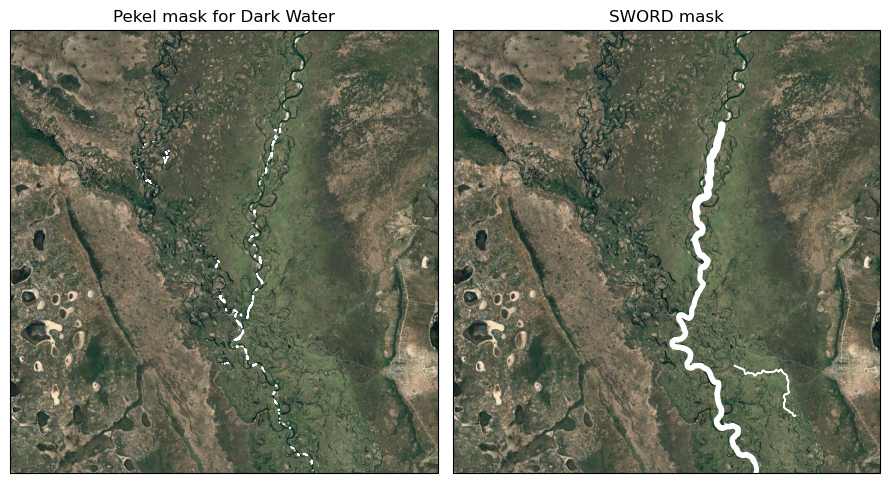

In [10]:
extent = [longitude_min, longitude_max, latitude_min, latitude_max]

fig = plt.figure(figsize=(9,5), layout='tight')
ax1 = fig.add_subplot(1, 2, 1, projection=tiler.crs)
ax1.set_title('Pekel mask for Dark Water')
ax1.set_extent(extent, geodetic)
ax1.add_image(tiler, 11)
ax1.add_geometries(pekel_X_100_poly, wgs84, edgecolor='white', facecolor='white')

if poly_sword is not None:
    ax2 = fig.add_subplot(1, 2, 2, projection=tiler.crs)
    ax2.set_title('SWORD mask')
    ax2.set_extent(extent, geodetic)
    ax2.add_image(tiler, 11)
    ax2.add_geometries(poly_sword, wgs84, edgecolor='white', facecolor='white')
    
plt.show()

Get the mask polygon if the user wants to reduce the studied region (use of Pekel, PLD or SWORD)

In [11]:
# Create the polygon mask needed for intersection with PIXC to limit the number of points
if use_mask == 1:
    print('PLD Mask intersection will be performed\n')
    polygon_mask = get_PLD_mask(lake_id, pld_path, inputpixcfiles[0])
elif use_mask == 2:
    print('Pekel Mask intersection will be performed\n')
    polygon_mask = extract_Pekel_polygon(data_pekel, occ_min=0, occ_max=100, bufsize=mask_buffer_size)
elif use_mask == 3:
    print('Sword Mask intersection will be performed\n')
    polygon_mask = get_poly_sword_from_reach(df_reach_data, buffer_size=mask_buffer_size)
else:
    polygon_mask = None

# Extracting bathymetry points from PIXC

Here is the main part of the notebook where the bathymetry points will be extracted for each PIXC in the list (previously determined).

For each PIXC, all PIXC points are labelized into 'water' bodies. On each body, we either apply the Bathtub Ring method or we categorize them into land, water or water-land depending on the option chosen by the user at the beginning of the notebook. For land bodies a direct extraction is performed. On water bodies the Bathtub Ring method is applied and on water-land bodies we clusterize them to separate water from land and then apply the Bathtub Ring method or do a direct extraction respectively.

At the end of the cell (still on each PIXC), the borders of the PIXC tiles are removed to eliminate false contours/bathymetries and some filtering based on quality flags is applied.

All PIXC results are merged into one single Dataframe.

2026-02-06 16:27:11,010 [INFO] PIXC: /work/SWOT/swotdev/swotdev/stephag/floodplain/run/testcase_Barotse/input/pixc/SWOT_L2_HR_PIXC_015_305_128R_20240519T050603_20240519T050614_PIC0_01.nc


Processing PIXC 1/1


2026-02-06 16:28:15,687 [INFO] Extract water points
2026-02-06 16:28:15,862 [INFO] Remove pixels too close to near_range
2026-02-06 16:28:19,991 [INFO] Extract contiguous water points by keeping only water bodies whose area is greater than threshold


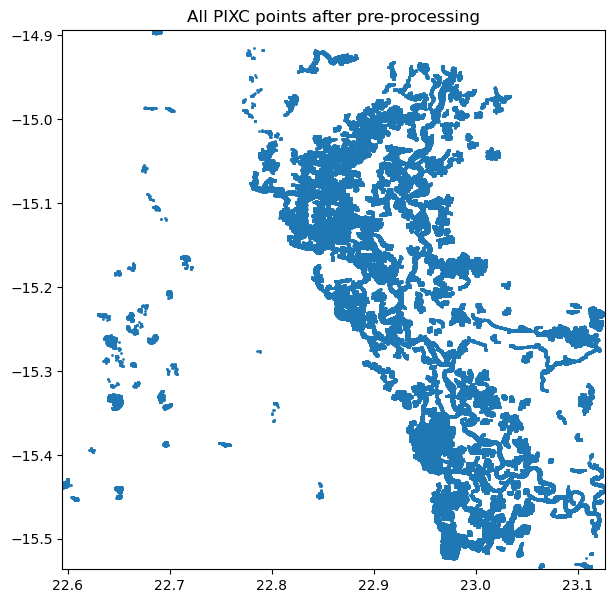

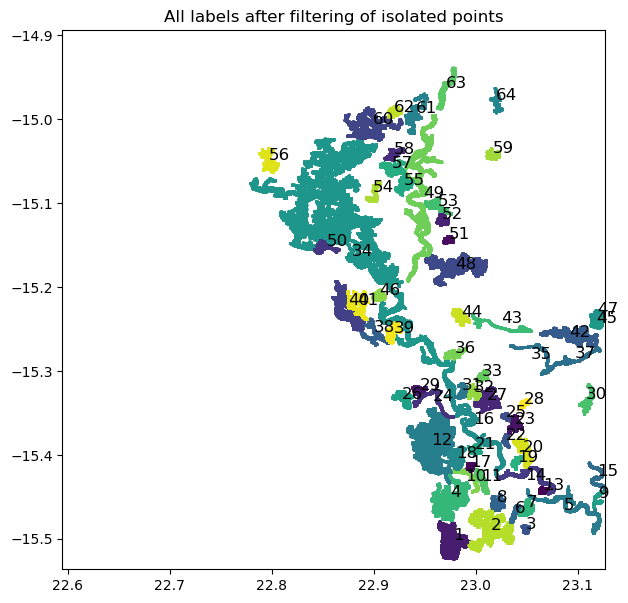

/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/water_or_land.py:184: RuntimeWarning: invalid value encountered in log10
  sig0 = np.where(sig0 > 0, 10 * np.log10(sig0), -1e6)
/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/water_or_land.py:184: RuntimeWarning: invalid value encountered in log10
  sig0 = np.where(sig0 > 0, 10 * np.log10(sig0), -1e6)
2026-02-06 16:28:35,930 [INFO] Ratio pekel, ratio sword: 0.038303397533001514, 0.0
2026-02-06 16:28:35,931 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.666844367980957, 0.024050487205386162, -0.3107142150402069, -0.2884528636932373, -0.1202847957611084, 0.9984650114540801, 0.9926969039659825


Number of water bodies found : 64

Processing Label 1 / 64


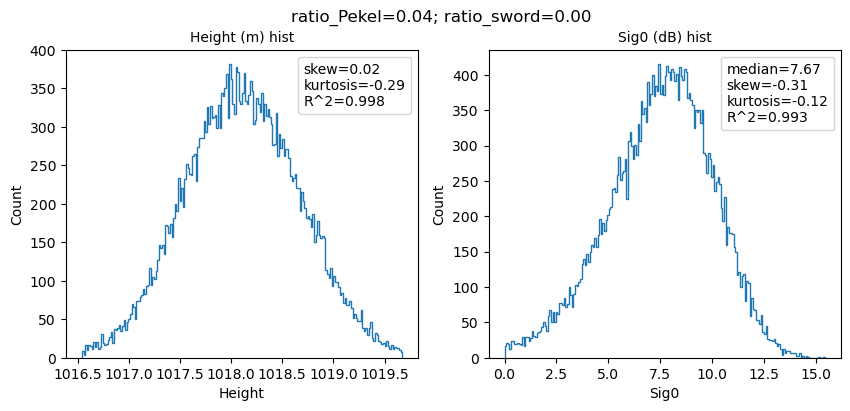

/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/water_or_land.py:184: RuntimeWarning: invalid value encountered in log10
  sig0 = np.where(sig0 > 0, 10 * np.log10(sig0), -1e6)
/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/water_or_land.py:184: RuntimeWarning: invalid value encountered in log10
  sig0 = np.where(sig0 > 0, 10 * np.log10(sig0), -1e6)
2026-02-06 16:28:36,264 [INFO] Ratio pekel, ratio sword: 0.03811081375755774, 0.0
2026-02-06 16:28:36,265 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.494125843048096, -0.01066905539482832, -0.2909473776817322, -0.2939305305480957, -0.10645699501037598, 0.9984680746650402, 0.9933263474155939


Body type: LAND

Processing Label 2 / 64


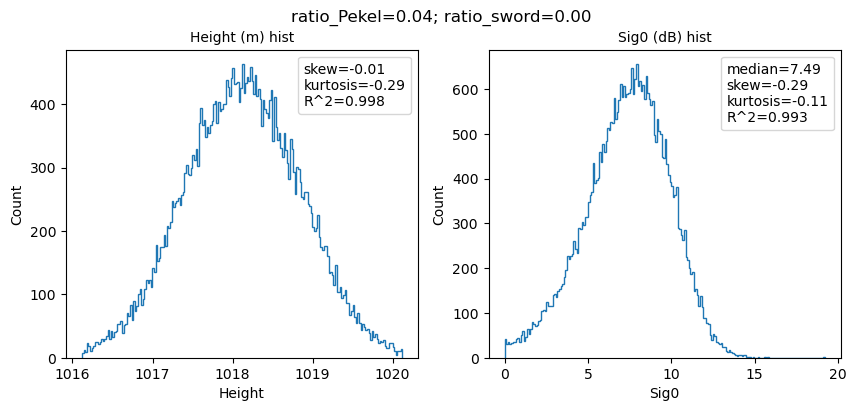

/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/water_or_land.py:184: RuntimeWarning: invalid value encountered in log10
  sig0 = np.where(sig0 > 0, 10 * np.log10(sig0), -1e6)
/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/water_or_land.py:184: RuntimeWarning: invalid value encountered in log10
  sig0 = np.where(sig0 > 0, 10 * np.log10(sig0), -1e6)
2026-02-06 16:28:36,531 [INFO] Ratio pekel, ratio sword: 0.01877346683354193, 0.0
2026-02-06 16:28:36,532 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.414579391479492, -0.002548903925344348, -0.2942328155040741, -0.06991004943847656, -0.3280751705169678, 0.9988513930779648, 0.9910091164739868


Body type: LAND

Processing Label 3 / 64


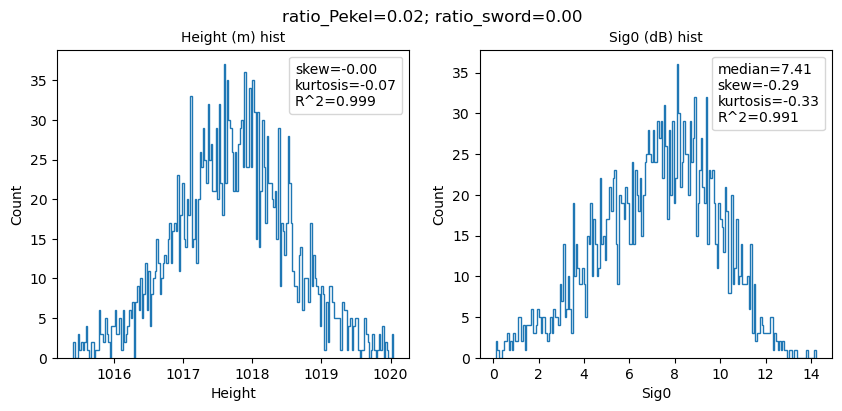

/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/water_or_land.py:184: RuntimeWarning: invalid value encountered in log10
  sig0 = np.where(sig0 > 0, 10 * np.log10(sig0), -1e6)
/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/water_or_land.py:184: RuntimeWarning: invalid value encountered in log10
  sig0 = np.where(sig0 > 0, 10 * np.log10(sig0), -1e6)
2026-02-06 16:28:36,857 [INFO] Ratio pekel, ratio sword: 0.11150836101570857, 0.0
2026-02-06 16:28:36,857 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.694499492645264, 0.016401907429099083, -0.270621657371521, -0.18430614471435547, -0.0815744400024414, 0.9989768711654061, 0.9943651644576893


Body type: LAND

Processing Label 4 / 64


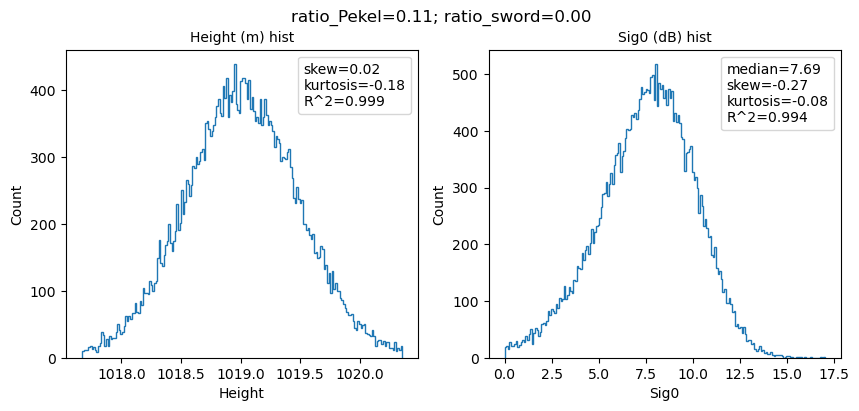

2026-02-06 16:28:37,127 [INFO] Ratio pekel, ratio sword: 0.03673135549111458, 0.0
2026-02-06 16:28:37,127 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):14.641032218933105, -0.3108643889427185, -0.3883254826068878, -0.05841541290283203, 0.2437586784362793, 0.9921839633587431, 0.9915598265910505


Body type: LAND

Processing Label 5 / 64


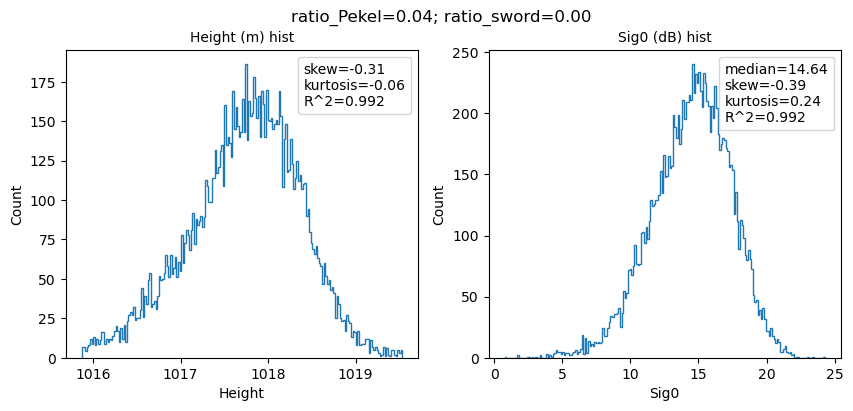

/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/water_or_land.py:184: RuntimeWarning: invalid value encountered in log10
  sig0 = np.where(sig0 > 0, 10 * np.log10(sig0), -1e6)
/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/water_or_land.py:184: RuntimeWarning: invalid value encountered in log10
  sig0 = np.where(sig0 > 0, 10 * np.log10(sig0), -1e6)
2026-02-06 16:28:37,389 [INFO] Ratio pekel, ratio sword: 0.045176333430486736, 0.0
2026-02-06 16:28:37,390 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.480048656463623, -0.028963128104805946, -0.27584895491600037, -0.19209647178649902, -0.18672561645507812, 0.9987138545231836, 0.99332921293199


Body type: LAND

Processing Label 6 / 64


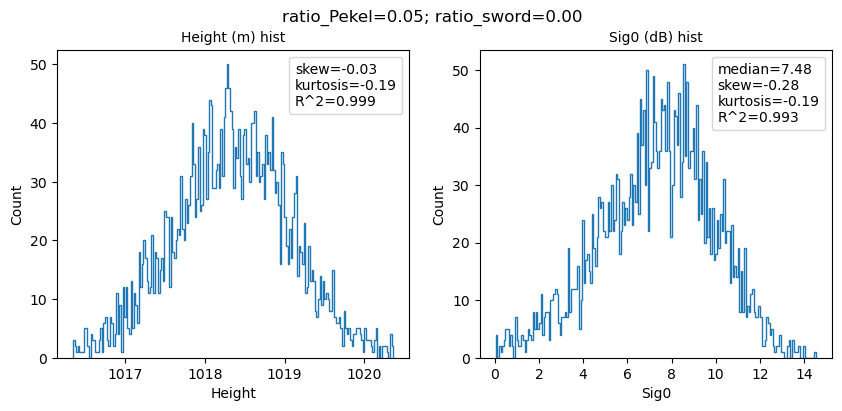

/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/water_or_land.py:184: RuntimeWarning: invalid value encountered in log10
  sig0 = np.where(sig0 > 0, 10 * np.log10(sig0), -1e6)
/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/water_or_land.py:184: RuntimeWarning: invalid value encountered in log10
  sig0 = np.where(sig0 > 0, 10 * np.log10(sig0), -1e6)
2026-02-06 16:28:37,652 [INFO] Ratio pekel, ratio sword: 0.013367539832568187, 0.0
2026-02-06 16:28:37,653 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.402300834655762, -0.009073076769709587, -0.3083652853965759, -0.13319110870361328, -0.12563538551330566, 0.9988886499765471, 0.9920558029901668


Body type: LAND

Processing Label 7 / 64


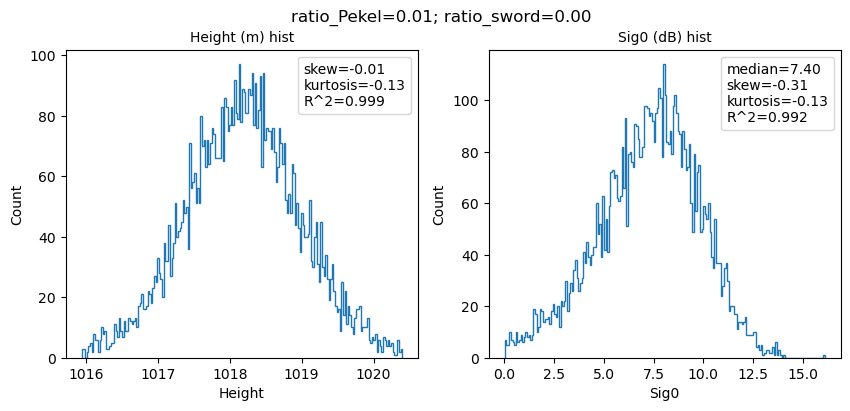

/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/water_or_land.py:184: RuntimeWarning: invalid value encountered in log10
  sig0 = np.where(sig0 > 0, 10 * np.log10(sig0), -1e6)
/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/water_or_land.py:184: RuntimeWarning: invalid value encountered in log10
  sig0 = np.where(sig0 > 0, 10 * np.log10(sig0), -1e6)
2026-02-06 16:28:37,917 [INFO] Ratio pekel, ratio sword: 0.020038308531015177, 0.0
2026-02-06 16:28:37,917 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.725259780883789, -0.023406030610203743, -0.295362651348114, -0.16756725311279297, -0.057198524475097656, 0.9989663838192387, 0.9932451002436327


Body type: LAND

Processing Label 8 / 64


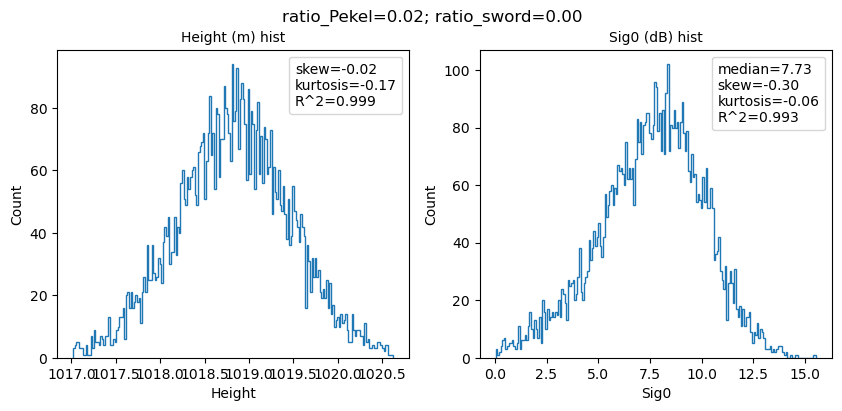

2026-02-06 16:28:38,184 [INFO] Ratio pekel, ratio sword: 0.0, 0.0
2026-02-06 16:28:38,185 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):14.795321464538574, -0.05767369642853737, -0.33243605494499207, -0.048079729080200195, 0.1811540126800537, 0.9989903177943638, 0.9931016357146236


Body type: LAND

Processing Label 9 / 64


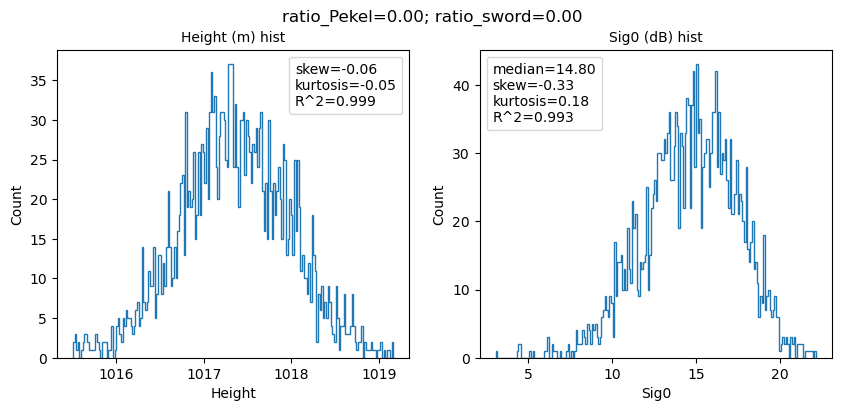

2026-02-06 16:28:38,448 [INFO] Ratio pekel, ratio sword: 0.7404761904761905, 0.0
2026-02-06 16:28:38,449 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):16.61593246459961, -0.12566913664340973, -0.40836232900619507, 0.10640144348144531, 0.17602896690368652, 0.9973445592061553, 0.9892559832770299


Body type: LAND

Processing Label 10 / 64


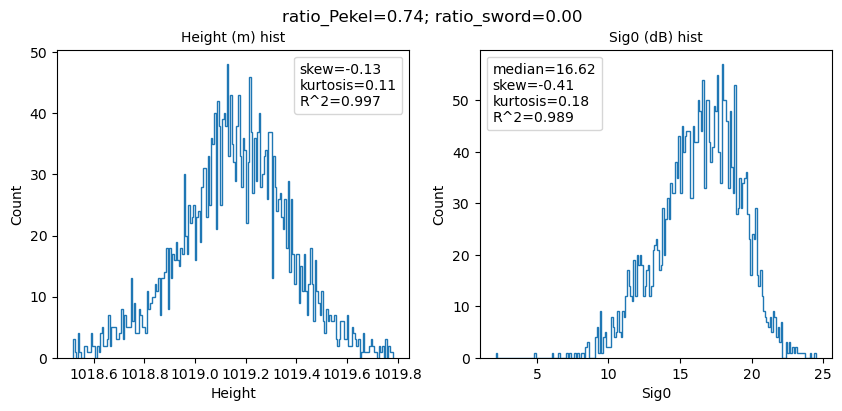

/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/water_or_land.py:184: RuntimeWarning: invalid value encountered in log10
  sig0 = np.where(sig0 > 0, 10 * np.log10(sig0), -1e6)
/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/water_or_land.py:184: RuntimeWarning: invalid value encountered in log10
  sig0 = np.where(sig0 > 0, 10 * np.log10(sig0), -1e6)
2026-02-06 16:28:38,764 [INFO] Ratio pekel, ratio sword: 0.008974160606529476, 0.0
2026-02-06 16:28:38,765 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):8.085484504699707, -0.015059925615787506, -0.3631003201007843, -0.25262999534606934, 0.053478240966796875, 0.9987189915560931, 0.991160744683092


Body type: WATER
Bathtub ring method is applied

Processing Label 11 / 64


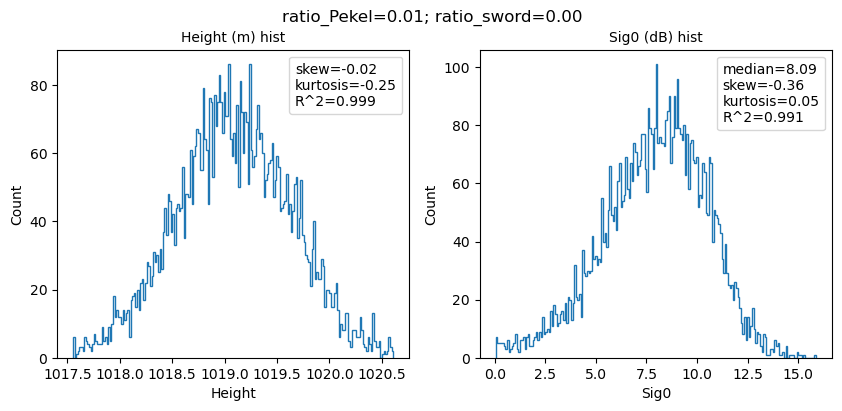

Body type: LAND

Processing Label 12 / 64


2026-02-06 16:28:39,160 [INFO] Ratio pekel, ratio sword: 0.42782999826999596, 0.0
2026-02-06 16:28:39,161 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.7787885665893555, 0.06104442849755287, 0.23545192182064056, -0.23626136779785156, 1.2064776420593262, 0.9983533725251033, 0.9874062827432013


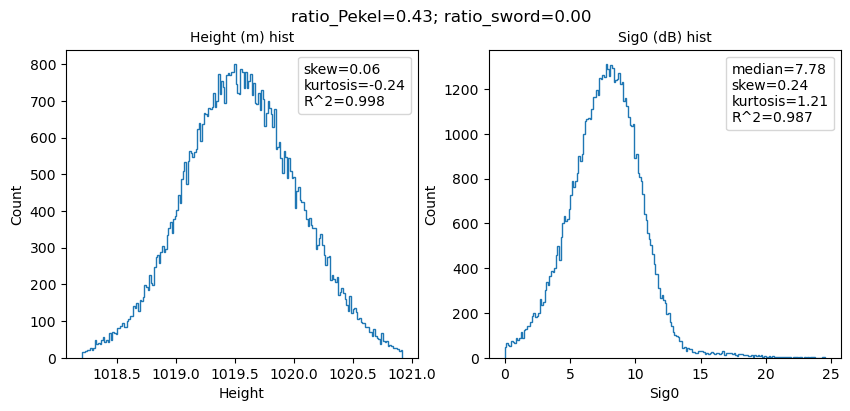

Body type: WATER
Bathtub ring method is applied


/work/scratch/env/stephag/.conda/envs/FPDEM_eodag_env/lib/python3.12/site-packages/osgeo/ogr.py:5960: RuntimeWarning: Self-intersection at or near point 22.974201553538137 -15.386717086357427
  return _ogr.Geometry_IsValid(self, *args)
/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/water_or_land.py:184: RuntimeWarning: invalid value encountered in log10
  sig0 = np.where(sig0 > 0, 10 * np.log10(sig0), -1e6)
/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/water_or_land.py:184: RuntimeWarning: invalid value encountered in log10
  sig0 = np.where(sig0 > 0, 10 * np.log10(sig0), -1e6)
2026-02-06 16:28:41,203 [INFO] Ratio pekel, ratio sword: 0.004035512510088781, 0.0
2026-02-06 16:28:41,204 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.508914947509766, 0.01252826303243637, -0.42464858293533325, -0.25136280059814453, -0.03575587272644043, 0.9988785817512487, 0.9861134748426137



Processing Label 13 / 64


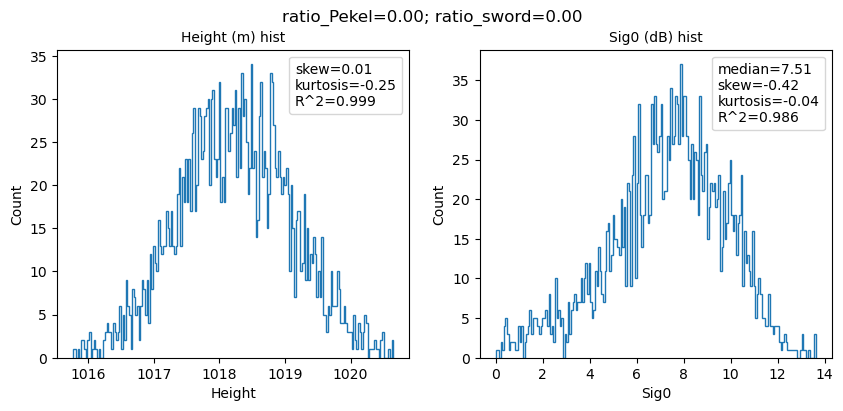

2026-02-06 16:28:41,485 [INFO] Ratio pekel, ratio sword: 0.6275139954385237, 0.5067385444743935
2026-02-06 16:28:41,485 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):15.343130111694336, -0.16209807991981506, -0.36490631103515625, -0.3054325580596924, 0.07364392280578613, 0.9963727897293775, 0.9919341723531419


Body type: LAND

Processing Label 14 / 64


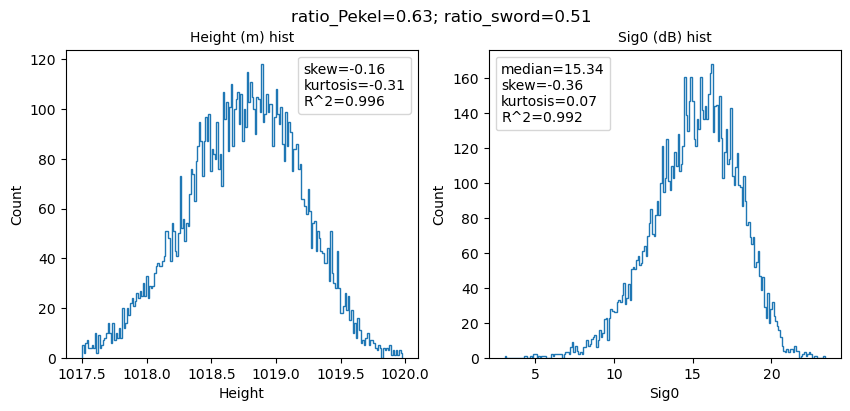

Body type: WATER
Bathtub ring method is applied

Processing Label 15 / 64


/work/scratch/env/stephag/.conda/envs/FPDEM_eodag_env/lib/python3.12/site-packages/osgeo/ogr.py:5960: RuntimeWarning: Self-intersection at or near point 23.069223505767251 -15.432932680824653
  return _ogr.Geometry_IsValid(self, *args)
2026-02-06 16:28:41,871 [INFO] Ratio pekel, ratio sword: 0.0, 0.0
2026-02-06 16:28:41,871 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):15.837480545043945, 0.0070009599439799786, -0.31253916025161743, -0.08017849922180176, 0.20804619789123535, 0.9990586533675524, 0.992794190720368


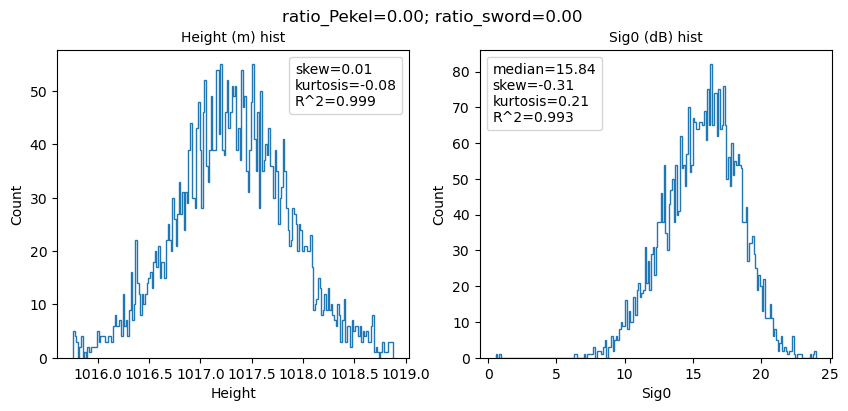

2026-02-06 16:28:42,186 [INFO] Ratio pekel, ratio sword: 0.8688589150339667, 0.7321059367923599
2026-02-06 16:28:42,186 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):16.20376205444336, -0.18882669508457184, -0.40629106760025024, -0.5273194313049316, -0.004438638687133789, 0.9921054212719559, 0.9889515674242879


Body type: LAND

Processing Label 16 / 64


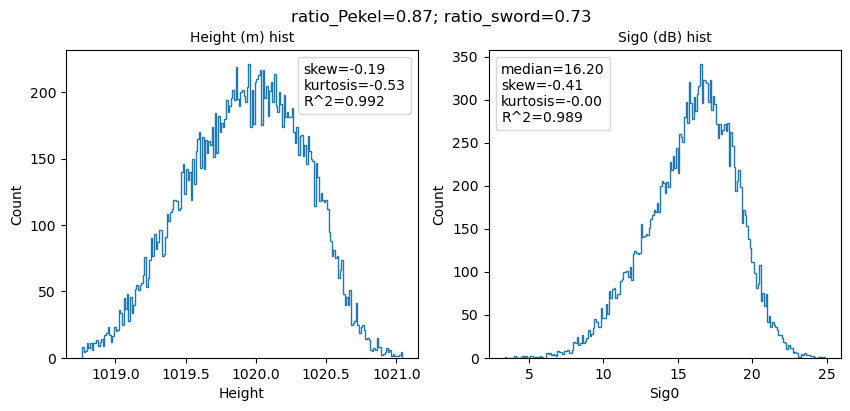

Body type: WATER
Bathtub ring method is applied


/work/scratch/env/stephag/.conda/envs/FPDEM_eodag_env/lib/python3.12/site-packages/osgeo/ogr.py:5960: RuntimeWarning: Self-intersection at or near point 22.990280850374429 -15.348238939645704
  return _ogr.Geometry_IsValid(self, *args)
2026-02-06 16:28:42,867 [INFO] Ratio pekel, ratio sword: 0.003816793893129771, 0.0
2026-02-06 16:28:42,867 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.770613670349121, 0.0078075965866446495, -0.2777140438556671, -0.3423910140991211, -0.11490821838378906, 0.9979374627510985, 0.9941956429776707



Processing Label 17 / 64


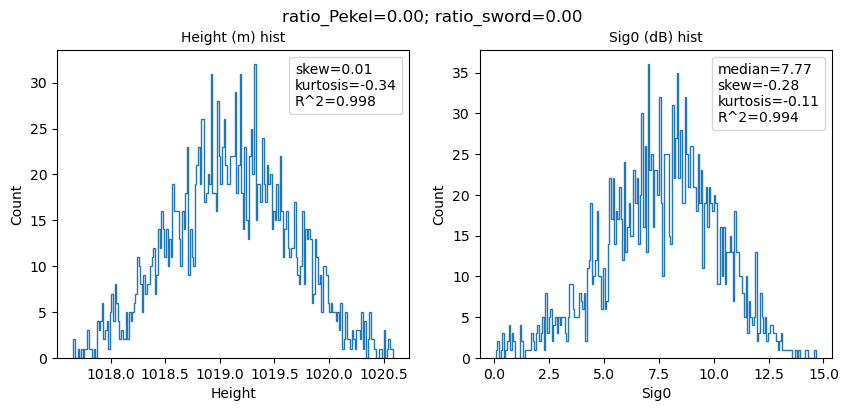

/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/water_or_land.py:184: RuntimeWarning: invalid value encountered in log10
  sig0 = np.where(sig0 > 0, 10 * np.log10(sig0), -1e6)
/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/water_or_land.py:184: RuntimeWarning: invalid value encountered in log10
  sig0 = np.where(sig0 > 0, 10 * np.log10(sig0), -1e6)
2026-02-06 16:28:43,161 [INFO] Ratio pekel, ratio sword: 0.24717939074840165, 0.0
2026-02-06 16:28:43,162 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.586444854736328, -0.036068178713321686, -0.287532776594162, -0.08232855796813965, -0.07976531982421875, 0.9988862947789635, 0.9931698879389075


Body type: LAND

Processing Label 18 / 64


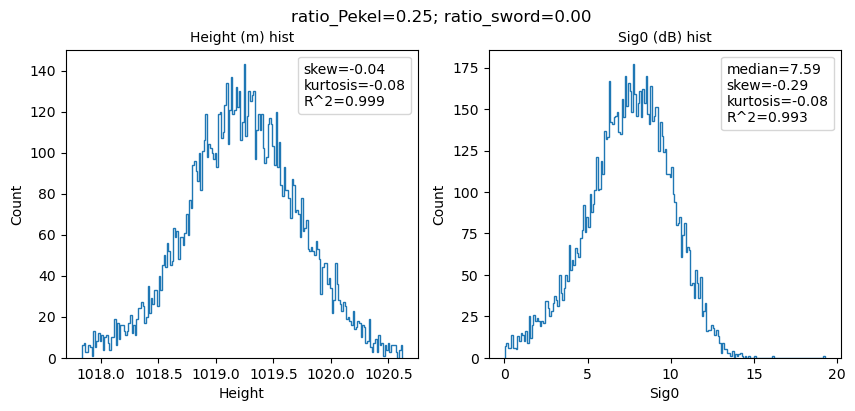

/work/scratch/env/stephag/.conda/envs/FPDEM_eodag_env/lib/python3.12/site-packages/osgeo/ogr.py:5960: RuntimeWarning: Self-intersection at or near point 22.989063709696435 -15.392522824830177
  return _ogr.Geometry_IsValid(self, *args)
/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/water_or_land.py:184: RuntimeWarning: invalid value encountered in log10
  sig0 = np.where(sig0 > 0, 10 * np.log10(sig0), -1e6)
/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/water_or_land.py:184: RuntimeWarning: invalid value encountered in log10
  sig0 = np.where(sig0 > 0, 10 * np.log10(sig0), -1e6)
2026-02-06 16:28:43,506 [INFO] Ratio pekel, ratio sword: 0.06819672131147542, 0.0
2026-02-06 16:28:43,507 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.505548000335693, 0.11812295019626617, -0.251353919506073, -0.12255716323852539, -0.26213979721069336, 0.9976673927382201, 0.9931778581349324


Body type: WATER
Bathtub ring method is applied

Processing Label 19 / 64


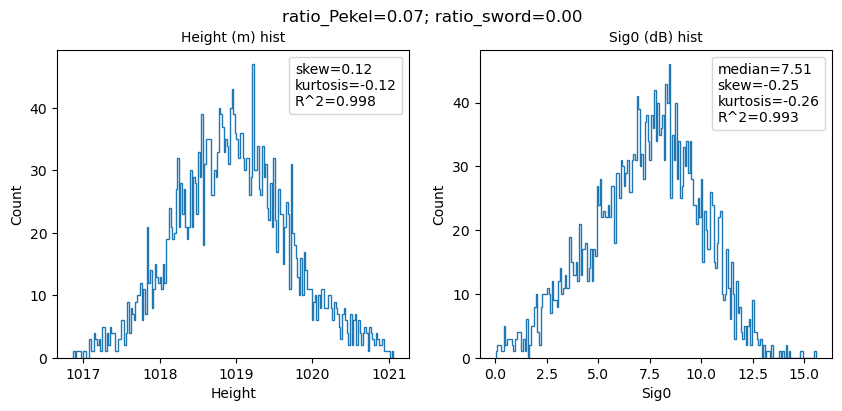

/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/water_or_land.py:184: RuntimeWarning: invalid value encountered in log10
  sig0 = np.where(sig0 > 0, 10 * np.log10(sig0), -1e6)
/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/water_or_land.py:184: RuntimeWarning: invalid value encountered in log10
  sig0 = np.where(sig0 > 0, 10 * np.log10(sig0), -1e6)
2026-02-06 16:28:43,777 [INFO] Ratio pekel, ratio sword: 0.037512537612838515, 0.0
2026-02-06 16:28:43,778 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.573200225830078, -0.016139298677444458, -0.27387282252311707, -0.24777555465698242, -0.054267168045043945, 0.9987857669039978, 0.9934524969560169


Body type: LAND

Processing Label 20 / 64


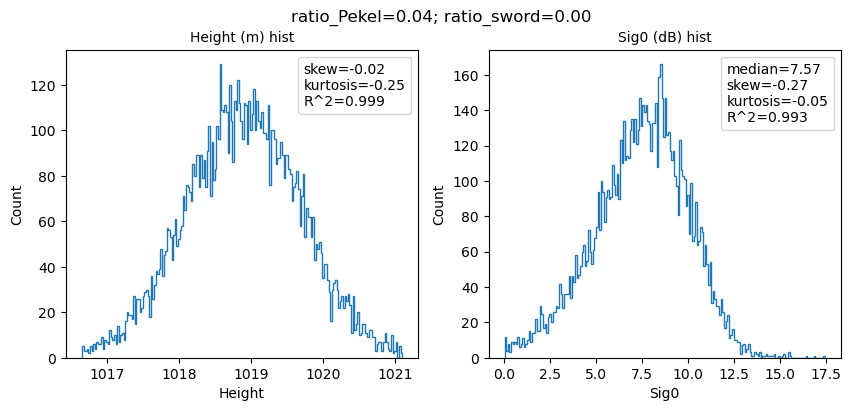

2026-02-06 16:28:44,062 [INFO] Ratio pekel, ratio sword: 0.15729963418689724, 0.0
2026-02-06 16:28:44,062 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.472190856933594, 0.05176210030913353, -0.3274179697036743, -0.3109757900238037, -0.03084850311279297, 0.9978751685408592, 0.9925065381880491


Body type: LAND

Processing Label 21 / 64


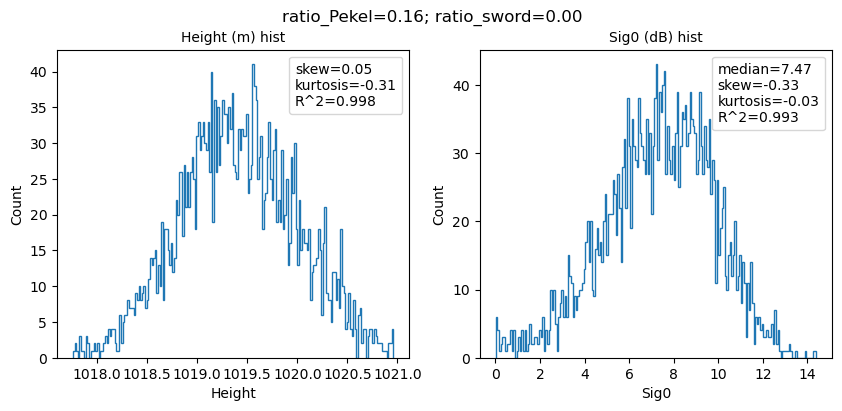

2026-02-06 16:28:44,336 [INFO] Ratio pekel, ratio sword: 0.08441558441558442, 0.0
2026-02-06 16:28:44,336 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):8.130563735961914, 0.08999542146921158, 0.8922523260116577, -0.07374143600463867, 1.7329959869384766, 0.9984300043476884, 0.9519109171455165


Body type: LAND

Processing Label 22 / 64


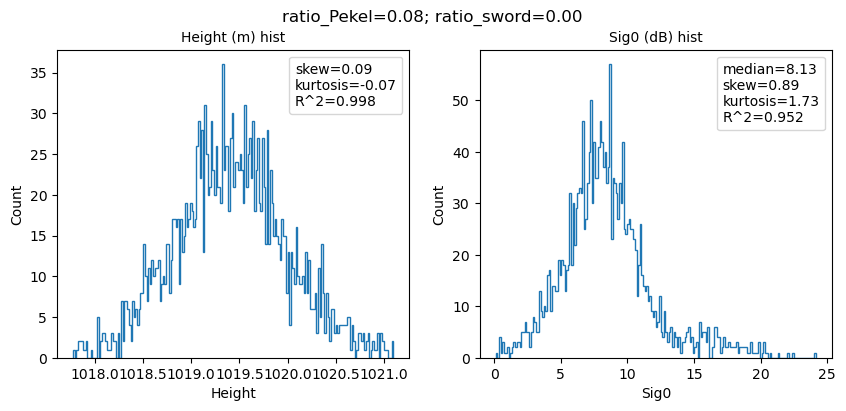

Body type: WATER_LAND
Clustering method is applied
    Azimuth/Range extrema:  lat  863 960 -- lon  3415 3510


2026-02-06 16:28:44,744 [INFO]     Normalizing the 4 parameters (lon, lat, h, sig0) for clustering


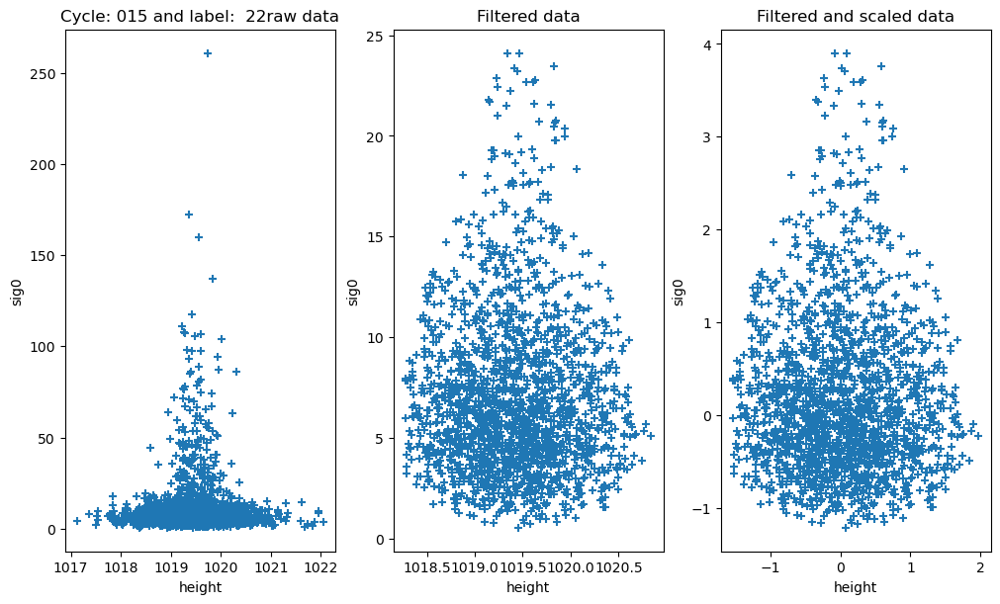

label_present [np.int64(0), np.int64(1), np.int64(-1)]


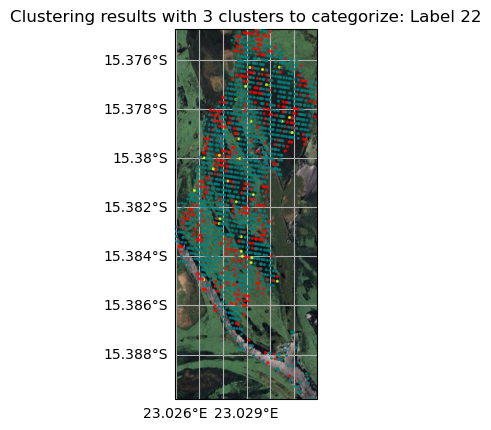

2026-02-06 16:28:49,590 [INFO]     Get the labels for soil and for water
2026-02-06 16:28:49,627 [INFO] Ratio pekel, ratio sword: 0.05581395348837209, 0.0
2026-02-06 16:28:49,628 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):8.430355072021484, 0.19281242787837982, -0.8898836374282837, -0.8728647232055664, 1.0851030349731445, 0.9743494224221538, 0.9552349639564117
2026-02-06 16:28:49,664 [INFO] Ratio pekel, ratio sword: 0.05710206995003569, 0.0
2026-02-06 16:28:49,665 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.56256103515625, -0.1148327887058258, -0.06567113101482391, -0.5997319221496582, -0.28993916511535645, 0.9915773195346449, 0.9965279258478426


label_present [np.int64(0), np.int64(1), np.int64(-1)]
    water_body_type:  {'LAND': [0, 1], 'WATER': []}


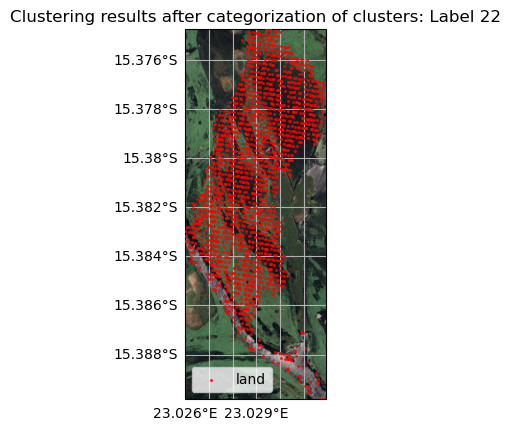

2026-02-06 16:28:50,217 [INFO] Ratio pekel, ratio sword: 0.16469517743403095, 0.0
2026-02-06 16:28:50,218 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.549439907073975, -0.011324119754135609, 0.6807989478111267, -0.016971826553344727, 1.9845490455627441, 0.9984295903251966, 0.9659538447099885



Processing Label 23 / 64


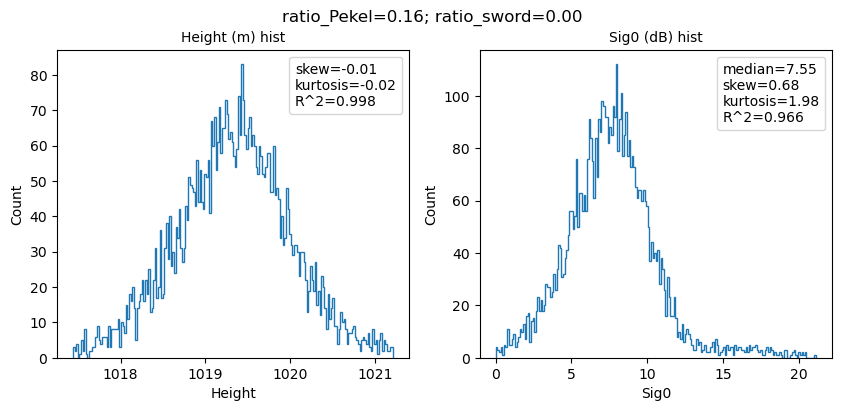

2026-02-06 16:28:50,484 [INFO] Ratio pekel, ratio sword: 0.807632398753894, 0.0
2026-02-06 16:28:50,485 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):16.99321746826172, 0.01895470730960369, -0.30551424622535706, 0.00048160552978515625, -0.026456832885742188, 0.99874527620749, 0.9931617206413913


Body type: LAND

Processing Label 24 / 64


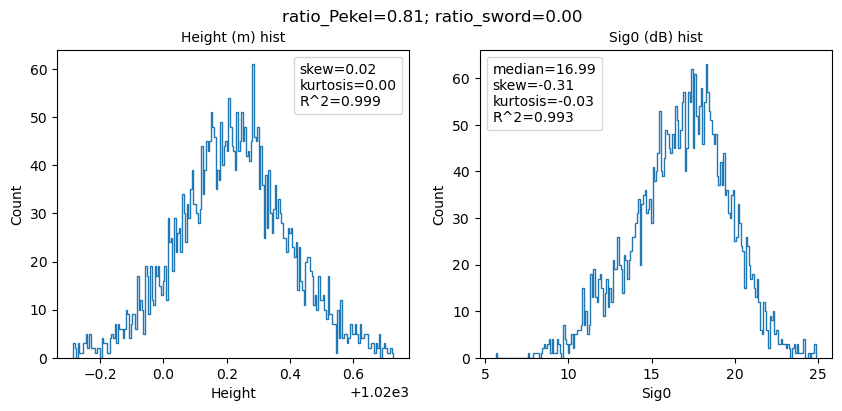

/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/water_or_land.py:184: RuntimeWarning: invalid value encountered in log10
  sig0 = np.where(sig0 > 0, 10 * np.log10(sig0), -1e6)
/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/water_or_land.py:184: RuntimeWarning: invalid value encountered in log10
  sig0 = np.where(sig0 > 0, 10 * np.log10(sig0), -1e6)
2026-02-06 16:28:50,798 [INFO] Ratio pekel, ratio sword: 0.05993065874195146, 0.0
2026-02-06 16:28:50,799 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.524839878082275, -0.01647978089749813, -0.30620136857032776, -0.11235880851745605, 0.0882577896118164, 0.998847714834135, 0.9924505377920272


Body type: WATER
Bathtub ring method is applied

Processing Label 25 / 64


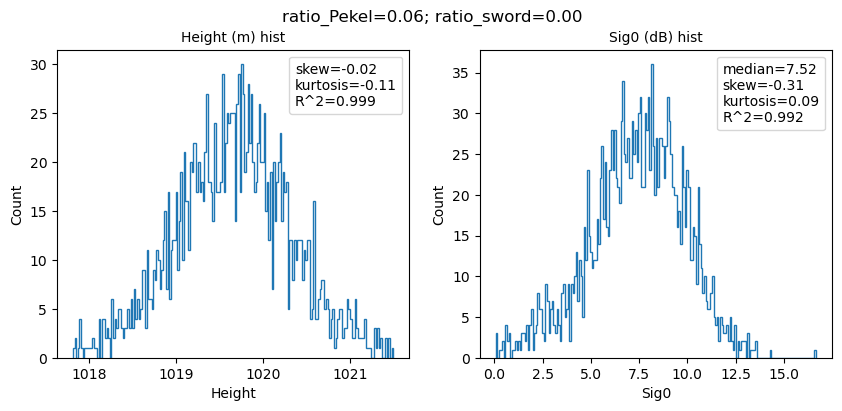

2026-02-06 16:28:51,075 [INFO] Ratio pekel, ratio sword: 0.5248146035367941, 0.0
2026-02-06 16:28:51,075 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.72792911529541, 0.03387969359755516, -0.24946224689483643, -0.20836877822875977, -0.10492062568664551, 0.9987220597104886, 0.9954335963383731


Body type: LAND

Processing Label 26 / 64


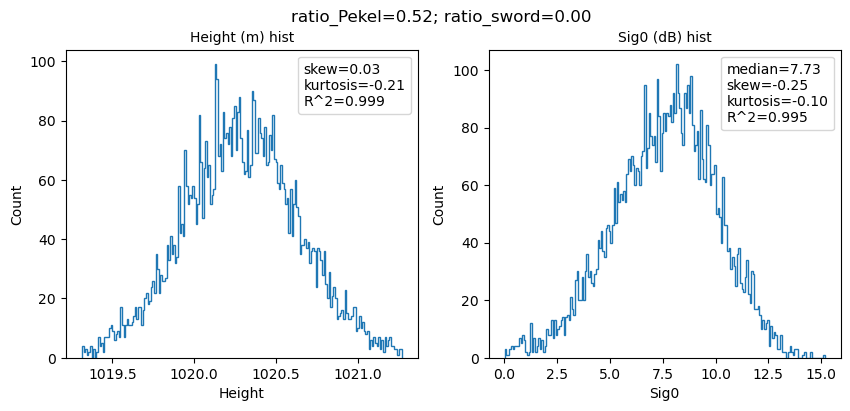

/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/water_or_land.py:184: RuntimeWarning: invalid value encountered in log10
  sig0 = np.where(sig0 > 0, 10 * np.log10(sig0), -1e6)
/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/water_or_land.py:184: RuntimeWarning: invalid value encountered in log10
  sig0 = np.where(sig0 > 0, 10 * np.log10(sig0), -1e6)
2026-02-06 16:28:51,377 [INFO] Ratio pekel, ratio sword: 0.033531021897810216, 0.0
2026-02-06 16:28:51,378 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.675877571105957, -0.009320643730461597, 0.35035017132759094, -0.1379711627960205, 1.4777064323425293, 0.9989873846359039, 0.983476395391189


Body type: WATER
Bathtub ring method is applied

Processing Label 27 / 64


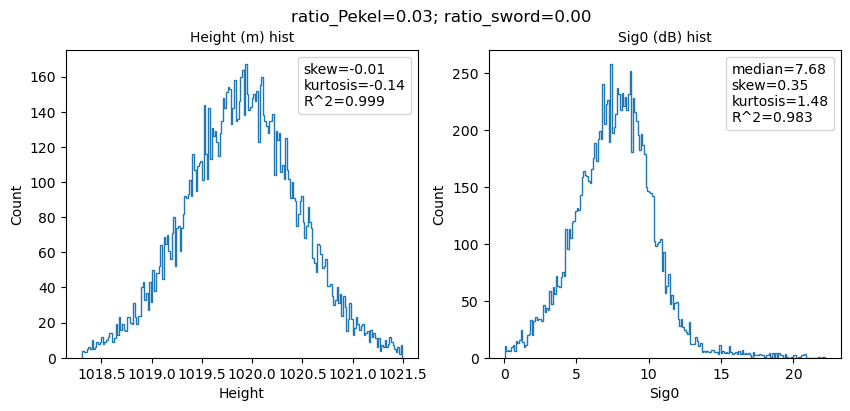

/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/water_or_land.py:184: RuntimeWarning: invalid value encountered in log10
  sig0 = np.where(sig0 > 0, 10 * np.log10(sig0), -1e6)
/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/water_or_land.py:184: RuntimeWarning: invalid value encountered in log10
  sig0 = np.where(sig0 > 0, 10 * np.log10(sig0), -1e6)
2026-02-06 16:28:51,647 [INFO] Ratio pekel, ratio sword: 0.23027226580526072, 0.0
2026-02-06 16:28:51,647 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.380293846130371, -0.036475468426942825, -0.2832140326499939, -0.18244194984436035, -0.15282154083251953, 0.998747736304806, 0.9931479795276241


Body type: LAND

Processing Label 28 / 64


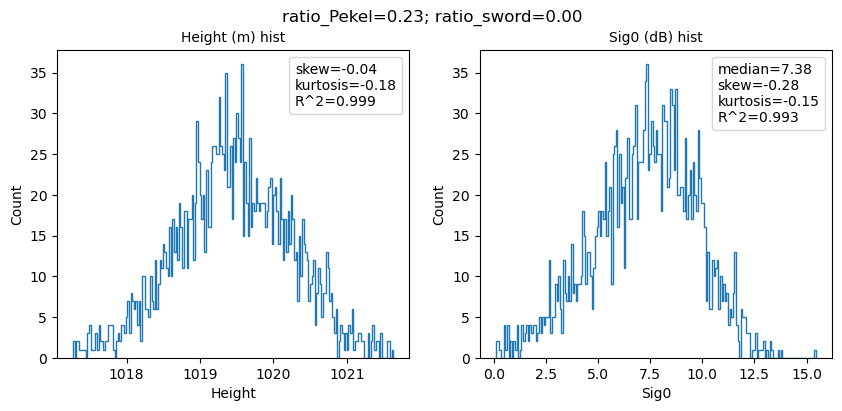

/work/scratch/env/stephag/.conda/envs/FPDEM_eodag_env/lib/python3.12/site-packages/osgeo/ogr.py:5960: RuntimeWarning: Self-intersection at or near point 23.049880496480686 -15.339514121711286
  return _ogr.Geometry_IsValid(self, *args)
2026-02-06 16:28:51,931 [INFO] Ratio pekel, ratio sword: 0.24468566259611035, 0.0
2026-02-06 16:28:51,932 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.7801713943481445, 0.05486949533224106, -0.07069610804319382, -0.17166781425476074, 0.49037837982177734, 0.9986172087466922, 0.9934197714724151


Body type: WATER
Bathtub ring method is applied

Processing Label 29 / 64


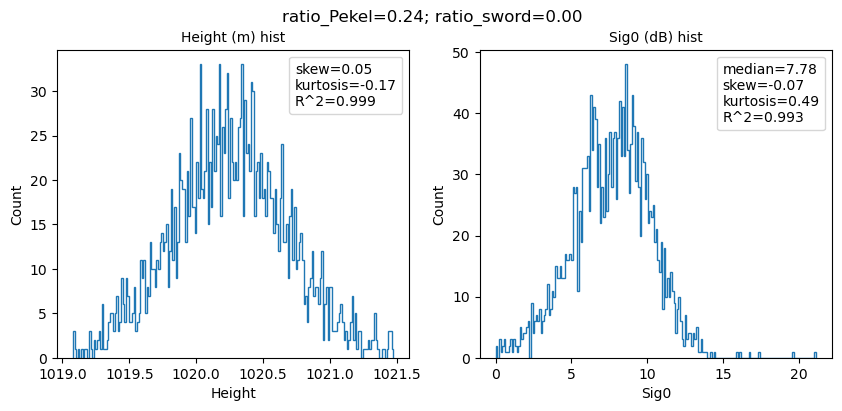

2026-02-06 16:28:52,214 [INFO] Ratio pekel, ratio sword: 0.0, 0.0
2026-02-06 16:28:52,215 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):15.148374557495117, 0.033481866121292114, -0.38005349040031433, 0.005197763442993164, -0.15139055252075195, 0.9991659574039209, 0.9888729175667206


Body type: WATER
Bathtub ring method is applied

Processing Label 30 / 64


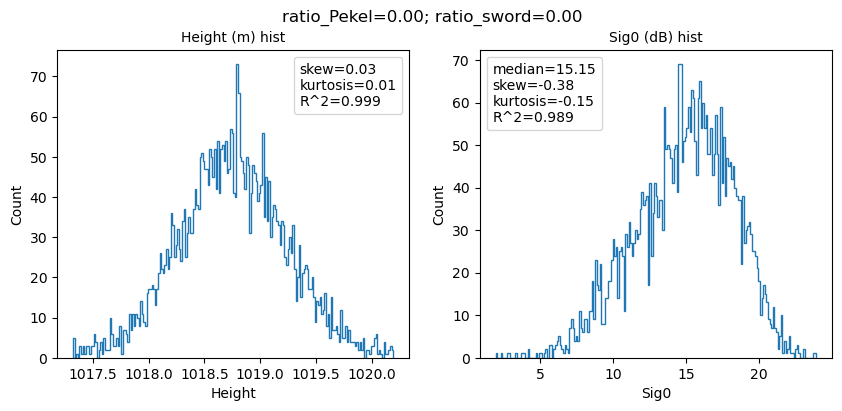

2026-02-06 16:28:52,496 [INFO] Ratio pekel, ratio sword: 0.521135850274282, 0.0012907389480477573
2026-02-06 16:28:52,497 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):14.293020248413086, 0.02724691666662693, -0.3123995065689087, 0.6113584041595459, -0.9252867698669434, 0.9907749181039157, 0.9642426500034769


Body type: LAND

Processing Label 31 / 64


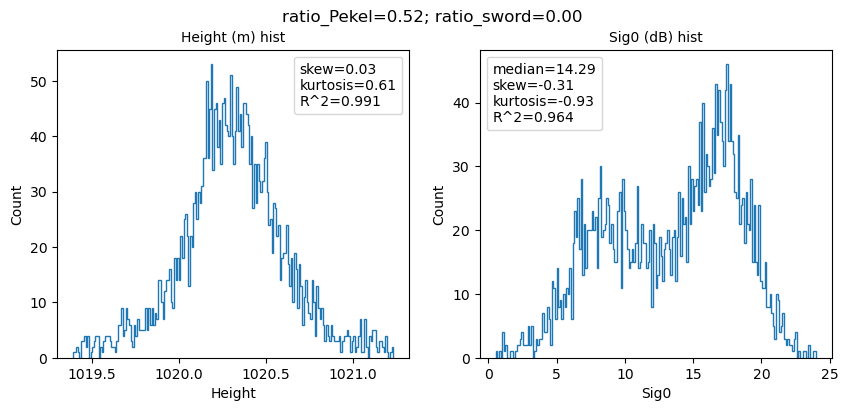

/work/scratch/env/stephag/.conda/envs/FPDEM_eodag_env/lib/python3.12/site-packages/osgeo/ogr.py:5960: RuntimeWarning: Self-intersection at or near point 22.983649143543158 -15.3260021033861
  return _ogr.Geometry_IsValid(self, *args)
2026-02-06 16:28:52,783 [INFO] Ratio pekel, ratio sword: 0.027323737496950475, 0.0
2026-02-06 16:28:52,784 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.66873836517334, -0.023776639252901077, -0.29833486676216125, -0.2348473072052002, -0.04754924774169922, 0.9986800707607161, 0.9932448388604517


Body type: WATER
Bathtub ring method is applied

Processing Label 32 / 64


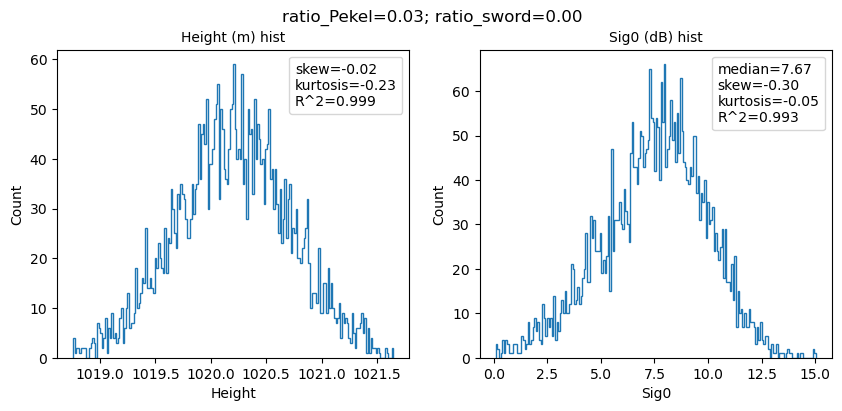

2026-02-06 16:28:53,059 [INFO] Ratio pekel, ratio sword: 0.03296321998612075, 0.0
2026-02-06 16:28:53,059 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.374899387359619, -0.07179729640483856, 0.05376188084483147, -0.305452823638916, 0.8547365665435791, 0.9981192708626485, 0.9907475312853979


Body type: LAND

Processing Label 33 / 64


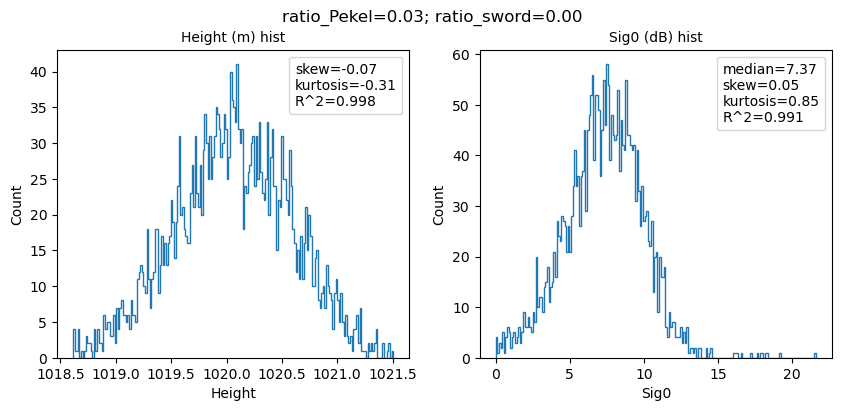

Body type: LAND

Processing Label 34 / 64


2026-02-06 16:28:53,676 [INFO] Ratio pekel, ratio sword: 0.5719013062409288, 0.09858409933881632
2026-02-06 16:28:53,677 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):9.421634674072266, -0.038920916616916656, 0.6580899357795715, 0.8417501449584961, -0.1800060272216797, 0.9707284904376993, 0.9552279112948093


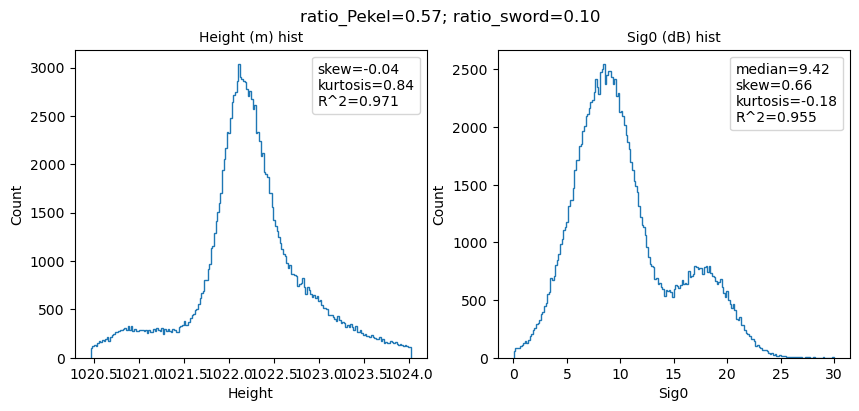

Body type: WATER_LAND
Clustering method is applied
    Azimuth/Range extrema:  lat  1253 2612 -- lon  1230 2829


2026-02-06 16:28:54,152 [INFO]     Normalizing the 4 parameters (lon, lat, h, sig0) for clustering


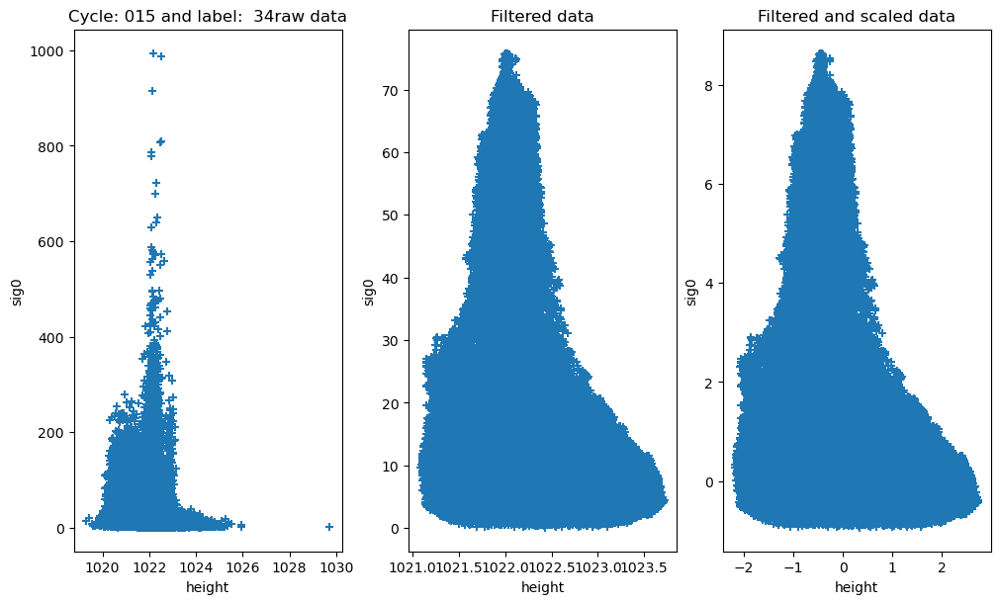

2026-02-06 16:28:55,346 [WARNING] The sample size is reduced because it is bigger than 100_000


label_present [np.int64(0), np.int64(1), np.int64(-1)]


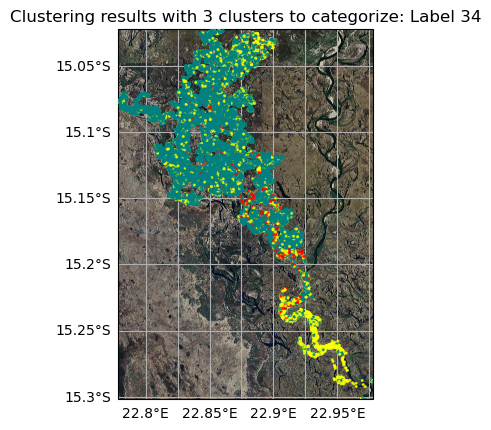

2026-02-06 16:36:35,818 [INFO]     Get the labels for soil and for water


label_present [np.int64(0), np.int64(1), np.int64(-1)]


2026-02-06 16:36:36,093 [INFO] Ratio pekel, ratio sword: 0.8819308545335942, 0.2811480756686236
2026-02-06 16:36:36,094 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):17.259841918945312, -0.09641913324594498, 0.0017660228768363595, -0.6612446308135986, -1.234341025352478, 0.9907155759079282, 0.9518977876470787
2026-02-06 16:36:36,562 [INFO] Ratio pekel, ratio sword: 0.4762988107275266, 0.021378015311281237
2026-02-06 16:36:36,562 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):8.631500244140625, 0.5644590854644775, 0.25644451379776, 0.01476597785949707, -0.25839734077453613, 0.9727653840961885, 0.9921644850970203


    water_body_type:  {'LAND': [1], 'WATER': [0]}


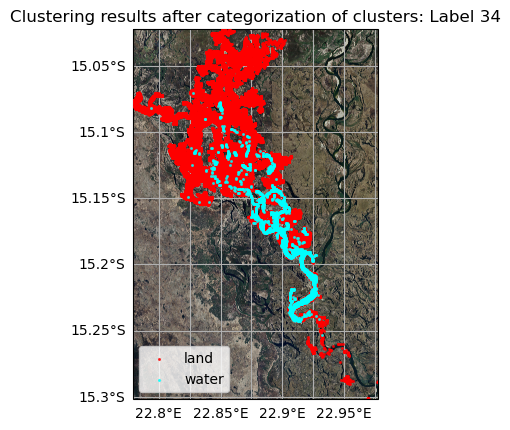

2026-02-06 16:36:56,339 [INFO] Ratio pekel, ratio sword: 0.6345541401273885, 0.3678343949044586
2026-02-06 16:36:56,340 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):14.858742713928223, -0.0497133694589138, -0.15197482705116272, -0.18148255348205566, -0.285083532333374, 0.9989134084370647, 0.9964863888809435



Processing Label 35 / 64


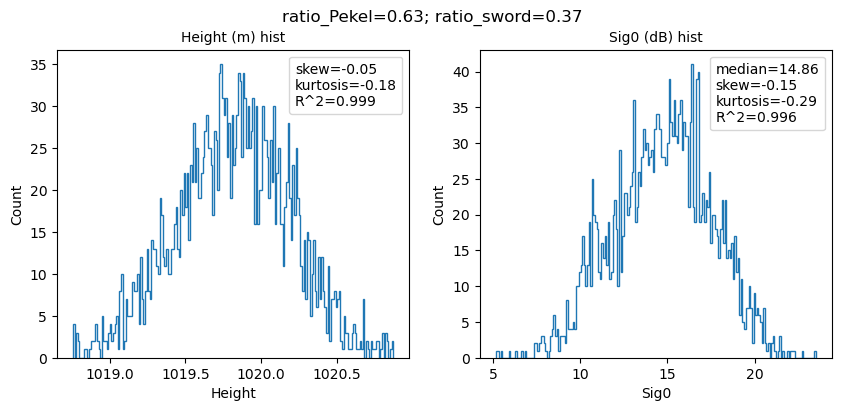

/work/scratch/env/stephag/.conda/envs/FPDEM_eodag_env/lib/python3.12/site-packages/osgeo/ogr.py:5960: RuntimeWarning: Self-intersection at or near point 23.070514814137891 -15.286230076022175
  return _ogr.Geometry_IsValid(self, *args)
2026-02-06 16:36:56,677 [INFO] Ratio pekel, ratio sword: 0.1069735951252539, 0.0071090047393364926
2026-02-06 16:36:56,677 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):8.103038787841797, 0.007305894047021866, 1.0114374160766602, -0.011809587478637695, 1.1632280349731445, 0.9990676308308567, 0.933547562949846


Body type: WATER
Bathtub ring method is applied

Processing Label 36 / 64


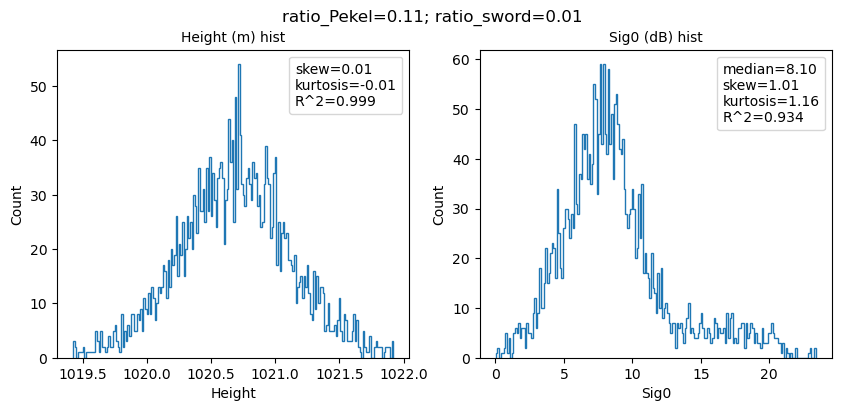

Body type: WATER_LAND
Clustering method is applied
    Azimuth/Range extrema:  lat  1351 1446 -- lon  2707 2902


2026-02-06 16:36:57,077 [INFO]     Normalizing the 4 parameters (lon, lat, h, sig0) for clustering


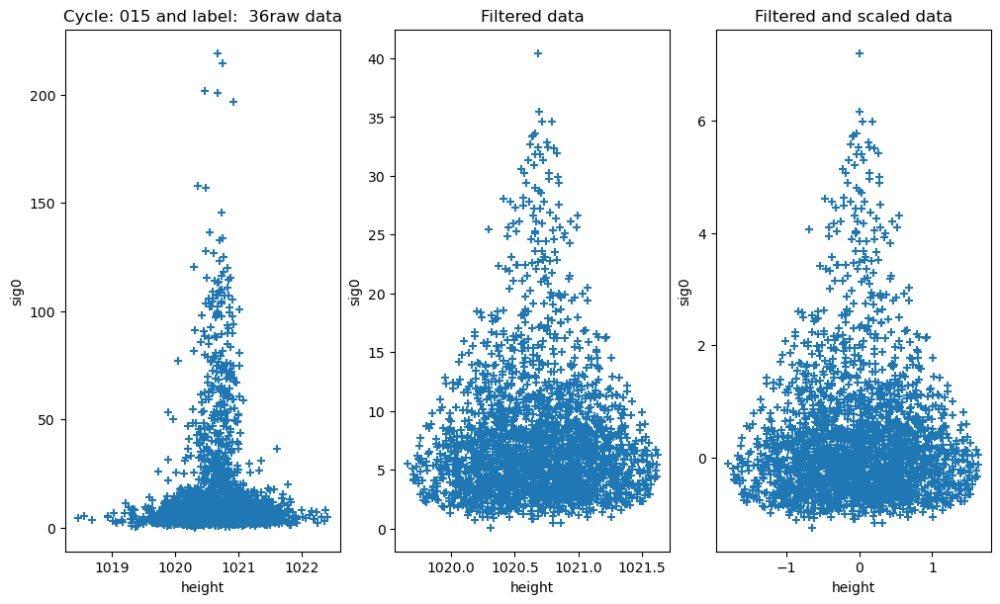

label_present [np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14), np.int64(15), np.int64(16), np.int64(17), np.int64(-1)]


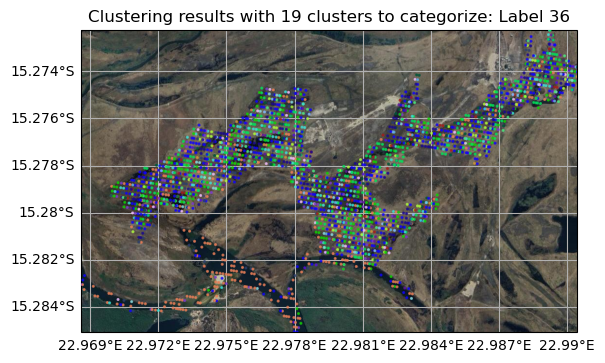

2026-02-06 16:37:04,225 [INFO]     Get the labels for soil and for water
2026-02-06 16:37:04,263 [INFO] Ratio pekel, ratio sword: 0.0, 0.0
2026-02-06 16:37:04,263 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):5.94630765914917, -0.16949138045310974, -0.34594595432281494, -0.9345347881317139, -0.9917299747467041, 0.9790529559574646, 0.9625518000369409
2026-02-06 16:37:04,301 [INFO] Ratio pekel, ratio sword: 0.009259259259259259, 0.0
2026-02-06 16:37:04,302 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):5.205885887145996, -0.25989583134651184, -0.3264363408088684, -0.8391103744506836, -0.6461739540100098, 0.9763981546880974, 0.9792981995167218
2026-02-06 16:37:04,336 [INFO] Ratio pekel, ratio sword: 0.03524229074889868, 0.0
2026-02-06 16:37:04,336 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):8.812769889831543, 0.05574936

label_present [np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14), np.int64(15), np.int64(16), np.int64(17), np.int64(-1)]


2026-02-06 16:37:04,443 [INFO] Ratio pekel, ratio sword: 0.0392156862745098, 0.0
2026-02-06 16:37:04,446 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):8.631446838378906, 0.11268486082553864, -0.6633155941963196, -1.3719394207000732, -0.2085285186767578, 0.9429995264198574, 0.9575583425055649
2026-02-06 16:37:04,484 [INFO] Ratio pekel, ratio sword: 0.05555555555555555, 0.007936507936507936
2026-02-06 16:37:04,484 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.684613227844238, 0.15142783522605896, 0.13082623481750488, -1.18608558177948, -0.5708012580871582, 0.9527852563413647, 0.9896439059128957
2026-02-06 16:37:04,519 [INFO] Ratio pekel, ratio sword: 0.05263157894736842, 0.0
2026-02-06 16:37:04,519 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):6.577032566070557, 0.24210664629936218, -0.14677715301513672, -0.8022258281

    water_body_type:  {'LAND': [0, 1, 2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17], 'WATER': [4]}


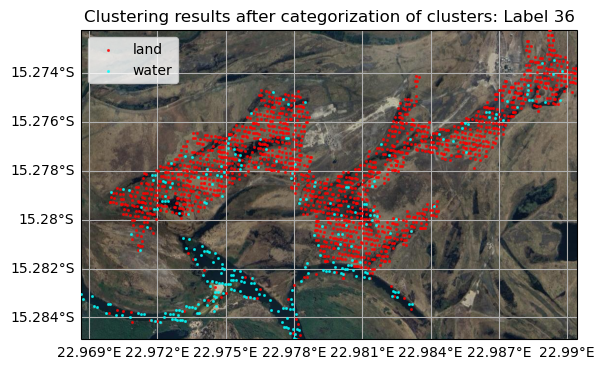

2026-02-06 16:37:05,883 [INFO] Ratio pekel, ratio sword: 0.2574367528495969, 0.0
2026-02-06 16:37:05,883 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):14.7252836227417, 0.059587717056274414, -0.3238496780395508, 0.6356163024902344, -0.10723066329956055, 0.9944389883022238, 0.9917174281428371



Processing Label 37 / 64


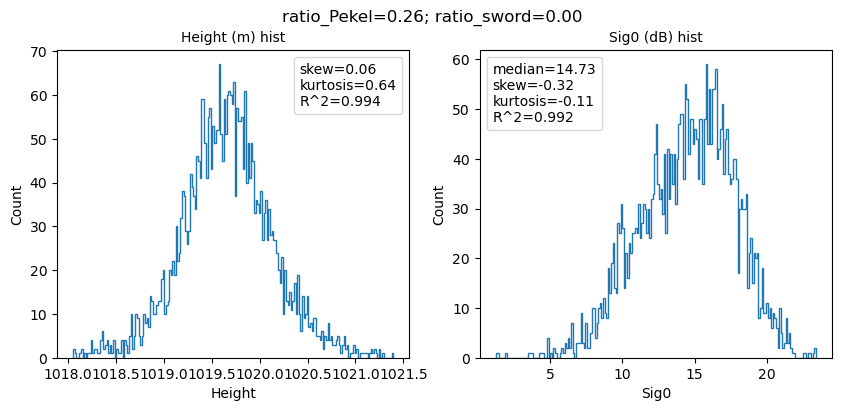

/work/scratch/env/stephag/.conda/envs/FPDEM_eodag_env/lib/python3.12/site-packages/osgeo/ogr.py:5960: RuntimeWarning: Self-intersection at or near point 23.118620048394625 -15.271794815144753
  return _ogr.Geometry_IsValid(self, *args)
2026-02-06 16:37:06,233 [INFO] Ratio pekel, ratio sword: 0.6037275349456401, 0.0
2026-02-06 16:37:06,233 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):13.940439224243164, 0.3362896740436554, -0.05755724757909775, 0.7531571388244629, -1.2085275650024414, 0.979018422964947, 0.9568337182646693


Body type: WATER
Bathtub ring method is applied

Processing Label 38 / 64


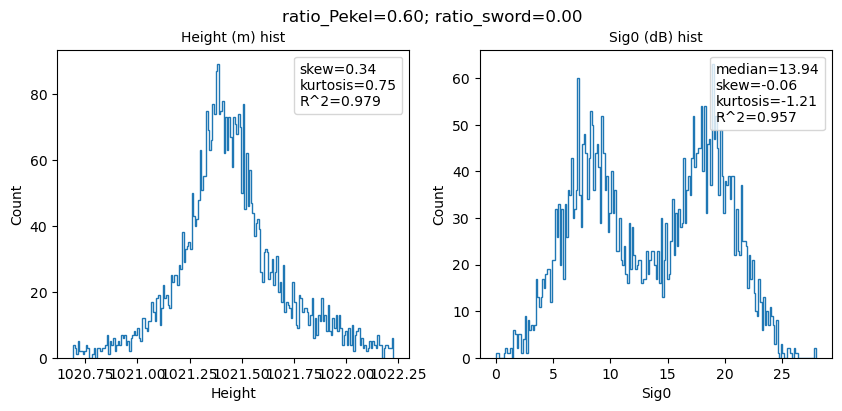

/work/scratch/env/stephag/.conda/envs/FPDEM_eodag_env/lib/python3.12/site-packages/osgeo/ogr.py:5960: RuntimeWarning: Self-intersection at or near point 22.891631247932182 -15.259354265226909
  return _ogr.Geometry_IsValid(self, *args)
2026-02-06 16:37:06,567 [INFO] Ratio pekel, ratio sword: 0.04980996199239848, 0.008401680336067214
2026-02-06 16:37:06,568 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):8.003281593322754, -0.09034248441457748, 0.32837074995040894, -0.06892561912536621, 1.0778298377990723, 0.9982139921915555, 0.9882602095275359


Body type: WATER
Bathtub ring method is applied

Processing Label 39 / 64


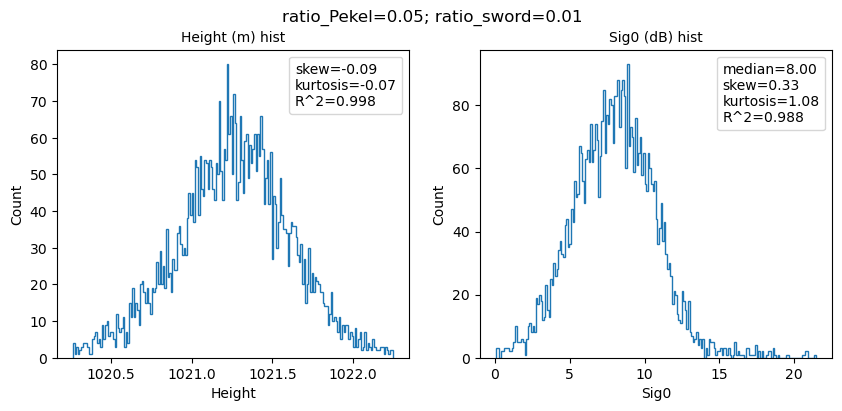

2026-02-06 16:37:06,848 [INFO] Ratio pekel, ratio sword: 0.386254140319181, 0.0
2026-02-06 16:37:06,848 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.77847957611084, 0.013504120521247387, 1.0881820917129517, -0.1092066764831543, 4.379852294921875, 0.9988965777654644, 0.9370714582336379


Body type: LAND

Processing Label 40 / 64


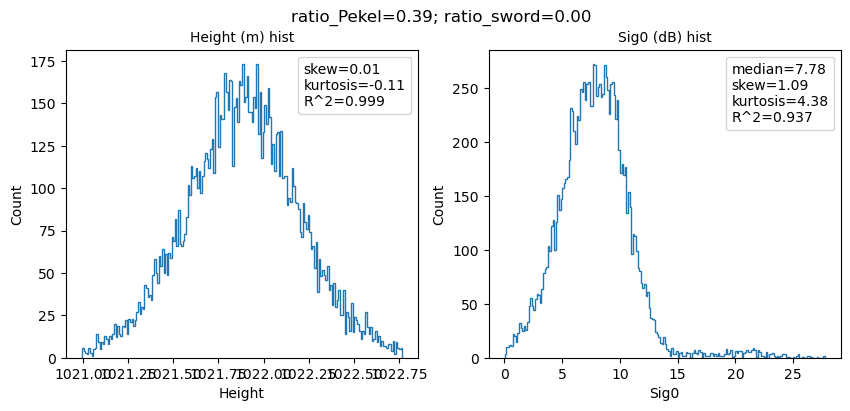

Body type: WATER_LAND
Clustering method is applied
    Azimuth/Range extrema:  lat  1454 1753 -- lon  1794 2071


2026-02-06 16:37:07,265 [INFO]     Normalizing the 4 parameters (lon, lat, h, sig0) for clustering


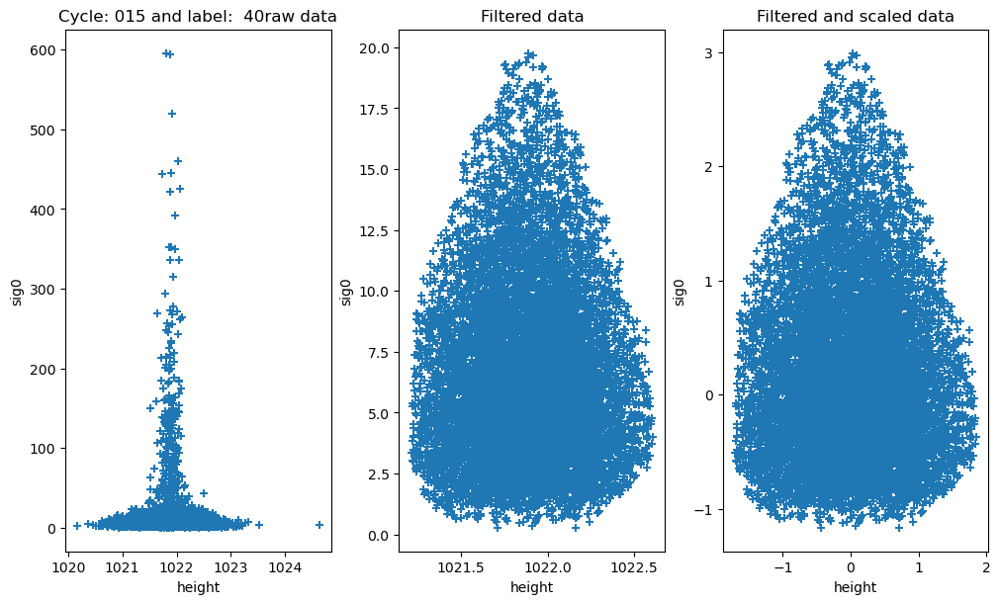

label_present [np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(-1)]


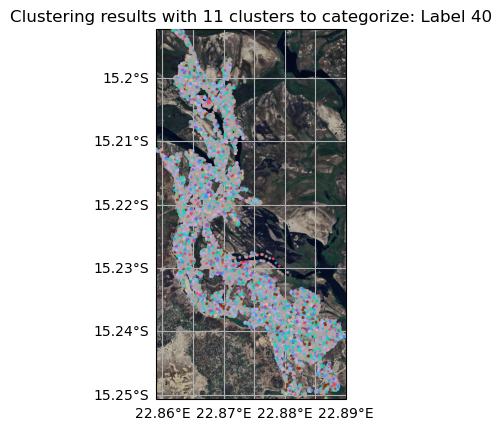

2026-02-06 16:37:40,642 [INFO]     Get the labels for soil and for water
2026-02-06 16:37:40,701 [INFO] Ratio pekel, ratio sword: 0.3870967741935484, 0.0
2026-02-06 16:37:40,702 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):3.7464911937713623, 0.12858393788337708, -0.4882270395755768, -0.8354177474975586, -0.5912280082702637, 0.9854169596004542, 0.9638881014025416
2026-02-06 16:37:40,746 [INFO] Ratio pekel, ratio sword: 0.29554655870445345, 0.0
2026-02-06 16:37:40,747 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):10.015710830688477, -0.5535123348236084, 0.09526640921831131, -0.3549768924713135, -0.5557100772857666, 0.9677984891756973, 0.9915950674616854
2026-02-06 16:37:40,791 [INFO] Ratio pekel, ratio sword: 0.4155251141552511, 0.0
2026-02-06 16:37:40,792 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):4.47304773330688

label_present [np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(-1)]


2026-02-06 16:37:40,884 [INFO] Ratio pekel, ratio sword: 0.34594594594594597, 0.0
2026-02-06 16:37:40,888 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.824041843414307, 0.07933048903942108, -0.4687039852142334, -0.894219160079956, -1.2649264335632324, 0.9794691307248841, 0.8962275350624246
2026-02-06 16:37:40,931 [INFO] Ratio pekel, ratio sword: 0.37130801687763715, 0.0
2026-02-06 16:37:40,932 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):6.083517074584961, -0.25342899560928345, -0.8867912292480469, -0.6232397556304932, 0.5075798034667969, 0.984941689891893, 0.9436139179616145
2026-02-06 16:37:40,985 [INFO] Ratio pekel, ratio sword: 0.38005390835579517, 0.0
2026-02-06 16:37:40,987 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):6.788300514221191, 0.1070958748459816, -0.4214611351490021, -0.8619472980499268, -0.5544633

    water_body_type:  {'LAND': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9], 'WATER': []}


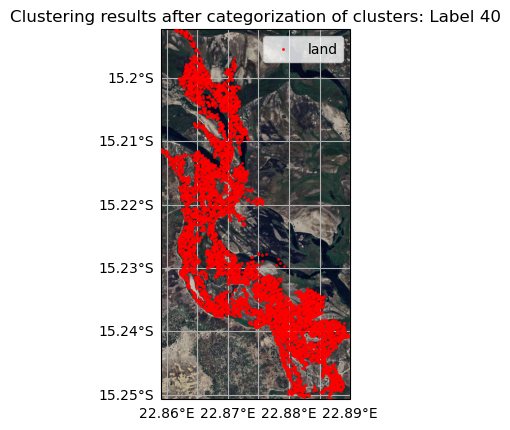

2026-02-06 16:37:42,305 [INFO] Ratio pekel, ratio sword: 0.6975124378109453, 0.0
2026-02-06 16:37:42,307 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):8.269865989685059, -3.1227820727508515e-05, 1.1550339460372925, 0.023499250411987305, 1.3146395683288574, 0.9981844899345383, 0.9084144589132602



Processing Label 41 / 64


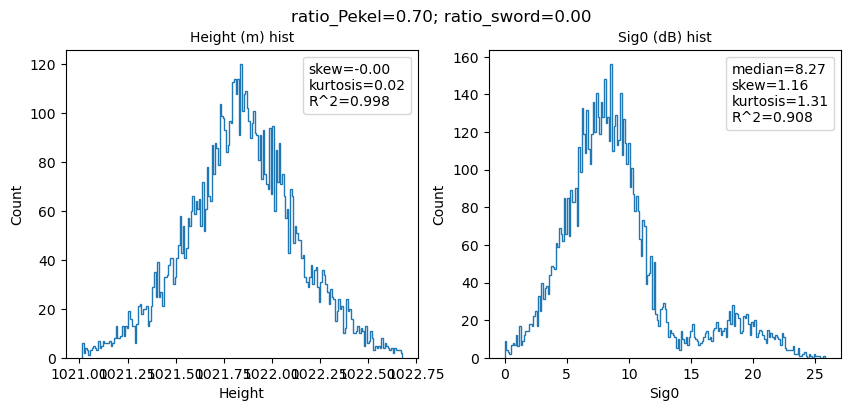

Body type: WATER_LAND
Clustering method is applied
    Azimuth/Range extrema:  lat  1521 1710 -- lon  1889 2088


2026-02-06 16:37:42,722 [INFO]     Normalizing the 4 parameters (lon, lat, h, sig0) for clustering


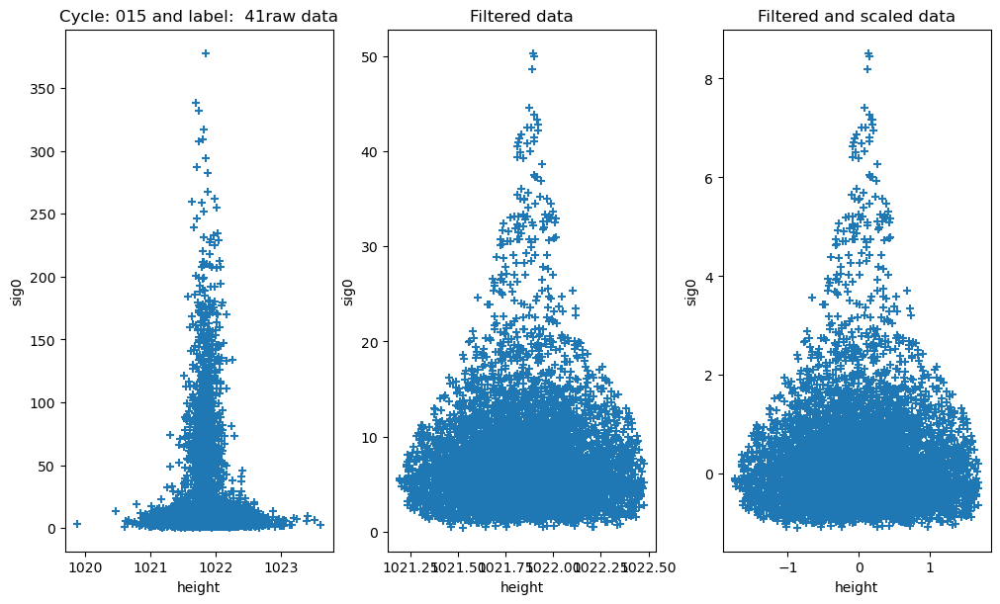

label_present [np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(-1)]


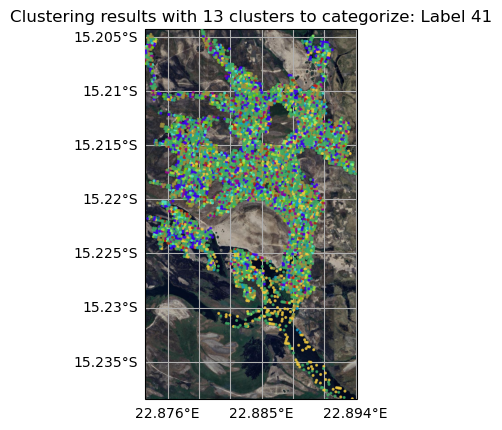

2026-02-06 16:38:01,273 [INFO]     Get the labels for soil and for water
2026-02-06 16:38:01,317 [INFO] Ratio pekel, ratio sword: 0.6980920314253648, 0.0
2026-02-06 16:38:01,317 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.665929794311523, -0.40665340423583984, -0.5222334265708923, -0.7352380752563477, -0.37065768241882324, 0.9648236772146026, 0.9677513413895771
2026-02-06 16:38:01,357 [INFO] Ratio pekel, ratio sword: 0.7379032258064516, 0.0
2026-02-06 16:38:01,357 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):4.789511680603027, -0.10482652485370636, -0.684376060962677, -0.6199610233306885, 0.14087438583374023, 0.9911954913345067, 0.9554772403794305
2026-02-06 16:38:01,395 [INFO] Ratio pekel, ratio sword: 0.6230769230769231, 0.0
2026-02-06 16:38:01,396 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):9.856115341186523

label_present [np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(-1)]


2026-02-06 16:38:01,475 [INFO] Ratio pekel, ratio sword: 0.6514285714285715, 0.0
2026-02-06 16:38:01,476 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.145738124847412, -0.20950528979301453, -0.20838545262813568, -1.142531156539917, -0.9545068740844727, 0.9577283132603732, 0.973280334664784
2026-02-06 16:38:01,515 [INFO] Ratio pekel, ratio sword: 0.635593220338983, 0.0
2026-02-06 16:38:01,516 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):9.6665678024292, 0.9921931624412537, 0.12187472730875015, 1.237809181213379, -0.8284204006195068, 0.934310802004862, 0.9825041976486305
2026-02-06 16:38:01,556 [INFO] Ratio pekel, ratio sword: 0.616580310880829, 0.0
2026-02-06 16:38:01,556 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):11.765300750732422, 0.06818284839391708, 0.7922521829605103, -0.49602270126342773, -0.41414761543273

    water_body_type:  {'LAND': [0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11], 'WATER': [6]}


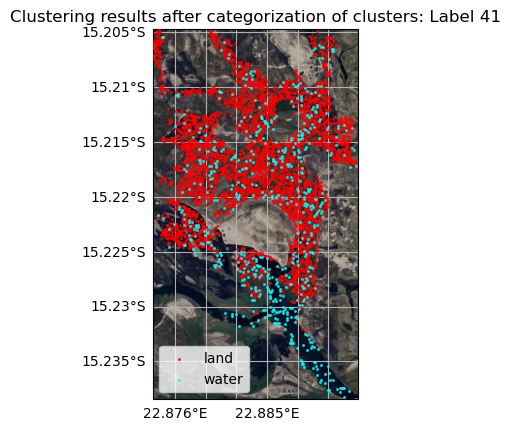

2026-02-06 16:38:03,055 [INFO] Ratio pekel, ratio sword: 0.3474120718783597, 0.0
2026-02-06 16:38:03,055 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):16.08615493774414, -0.08711037784814835, -0.48085933923721313, 0.08353400230407715, -0.2050328254699707, 0.9982059500011452, 0.9802665458723608



Processing Label 42 / 64


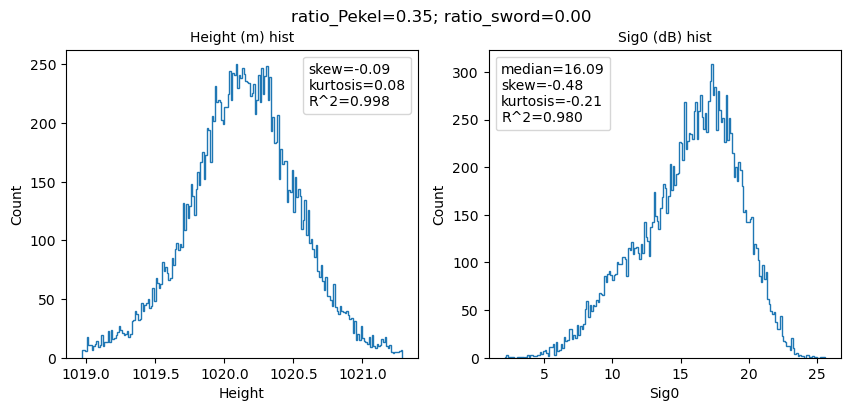

Body type: WATER
Bathtub ring method is applied


/work/scratch/env/stephag/.conda/envs/FPDEM_eodag_env/lib/python3.12/site-packages/osgeo/ogr.py:5960: RuntimeWarning: Self-intersection at or near point 23.117742398653551 -15.25598155699168
  return _ogr.Geometry_IsValid(self, *args)
2026-02-06 16:38:03,957 [INFO] Ratio pekel, ratio sword: 0.3653103653103653, 0.0
2026-02-06 16:38:03,958 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):13.705610275268555, -0.33718499541282654, -0.3322090208530426, 0.04664802551269531, -0.6356439590454102, 0.9913793192535869, 0.9801419672918336



Processing Label 43 / 64


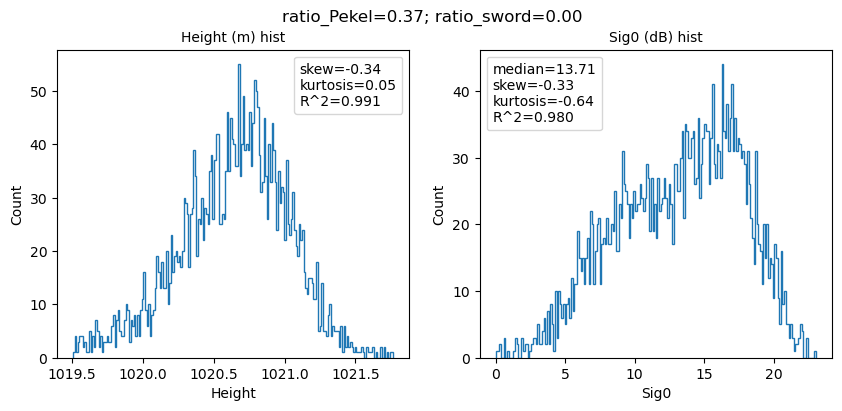

/work/scratch/env/stephag/.conda/envs/FPDEM_eodag_env/lib/python3.12/site-packages/osgeo/ogr.py:5960: RuntimeWarning: Self-intersection at or near point 23.052241156244431 -15.250758973751426
  return _ogr.Geometry_IsValid(self, *args)
2026-02-06 16:38:04,282 [INFO] Ratio pekel, ratio sword: 0.2052304964539007, 0.0
2026-02-06 16:38:04,283 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):8.956361770629883, 0.04382169619202614, 0.6457391381263733, 0.1349329948425293, -0.19819426536560059, 0.9967368708114642, 0.9519811955183151


Body type: WATER
Bathtub ring method is applied

Processing Label 44 / 64


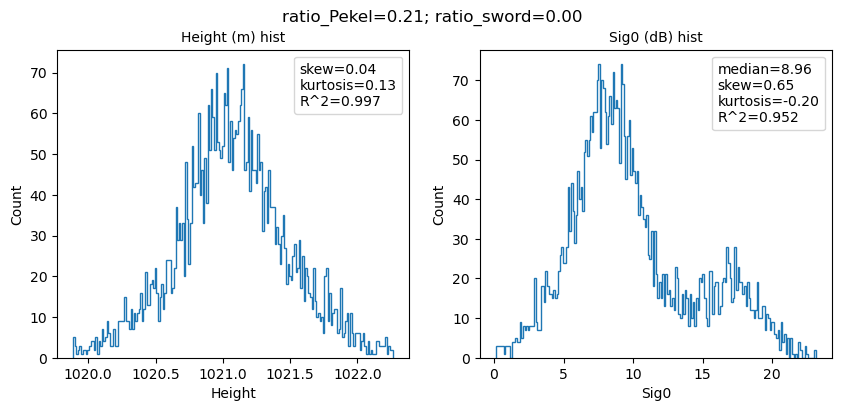

Body type: WATER_LAND
Clustering method is applied
    Azimuth/Range extrema:  lat  1562 1675 -- lon  2684 2871


2026-02-06 16:38:05,055 [INFO]     Normalizing the 4 parameters (lon, lat, h, sig0) for clustering


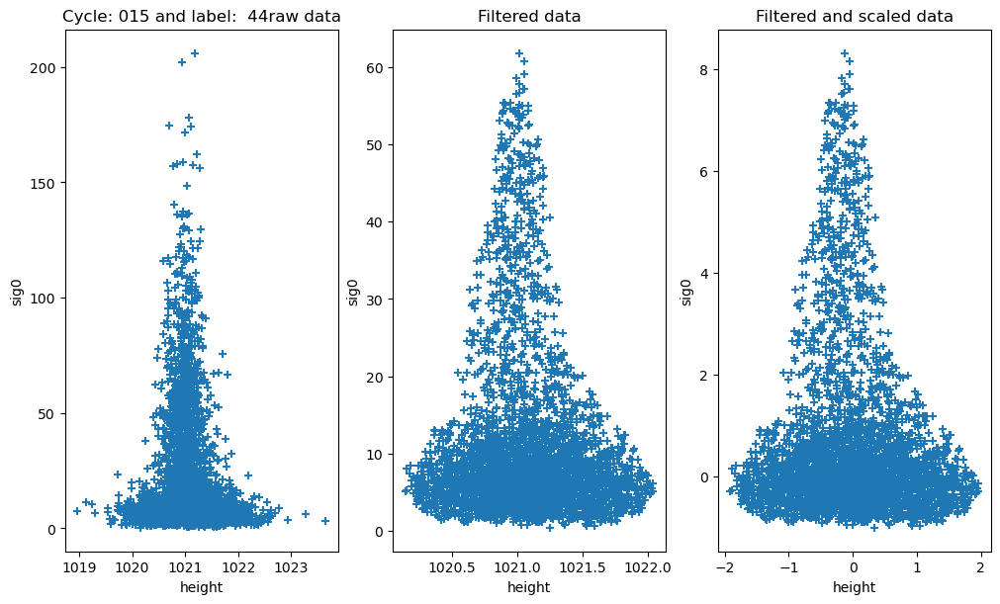

label_present [np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(-1)]


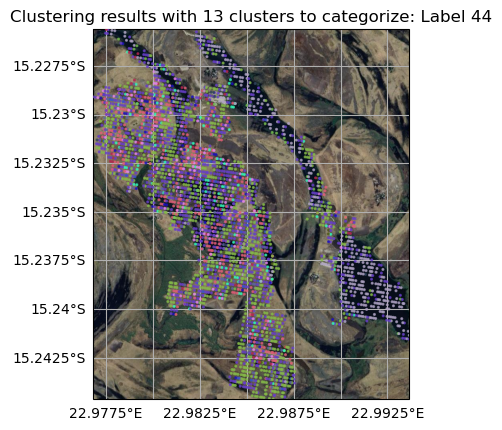

2026-02-06 16:38:14,716 [INFO]     Get the labels for soil and for water
2026-02-06 16:38:14,759 [INFO] Ratio pekel, ratio sword: 0.09554140127388536, 0.0
2026-02-06 16:38:14,760 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.561671257019043, -0.31509560346603394, -0.34071221947669983, -0.4211704730987549, -1.1406656503677368, 0.9826128611125433, 0.942077480806027
2026-02-06 16:38:14,798 [INFO] Ratio pekel, ratio sword: 0.02368421052631579, 0.0
2026-02-06 16:38:14,799 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):6.248405456542969, 0.28918278217315674, -0.703902542591095, -0.9149303436279297, -0.0031135082244873047, 0.9697580266342533, 0.9498880153484744
2026-02-06 16:38:14,835 [INFO] Ratio pekel, ratio sword: 0.10256410256410256, 0.0
2026-02-06 16:38:14,835 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):9.70937919616

label_present [np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(-1)]


2026-02-06 16:38:14,949 [INFO] Ratio pekel, ratio sword: 0.11842105263157894, 0.0
2026-02-06 16:38:14,950 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):11.416025161743164, 0.28068074584007263, 0.07349784672260284, -1.124714732170105, -0.8864500522613525, 0.9505755574956548, 0.9802287721388344
2026-02-06 16:38:14,987 [INFO] Ratio pekel, ratio sword: 0.09615384615384616, 0.0
2026-02-06 16:38:14,987 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):10.032464981079102, -0.6682917475700378, -0.21881359815597534, -0.610201358795166, -0.9208817481994629, 0.9319005628261843, 0.9792387694881142
2026-02-06 16:38:15,025 [INFO] Ratio pekel, ratio sword: 0.06976744186046512, 0.0
2026-02-06 16:38:15,026 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):11.391687393188477, -0.12091602385044098, 0.03486942872405052, -0.9243998527526855, -1.1

    water_body_type:  {'LAND': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9], 'WATER': [10, 11]}


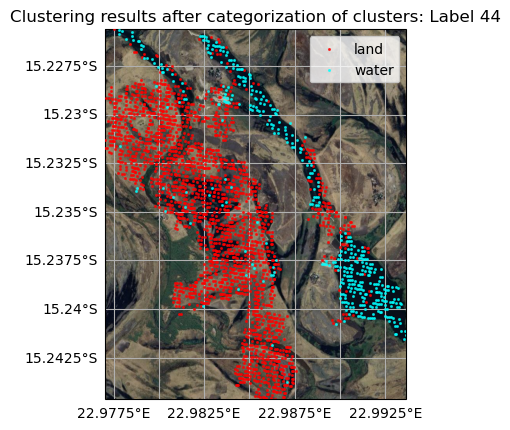

2026-02-06 16:38:16,235 [INFO] Ratio pekel, ratio sword: 0.0, 0.0
2026-02-06 16:38:16,236 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):16.889789581298828, 0.07786941528320312, -0.6083195209503174, 0.10953855514526367, 0.1622772216796875, 0.998034753712258, 0.9753019587906842



Processing Label 45 / 64


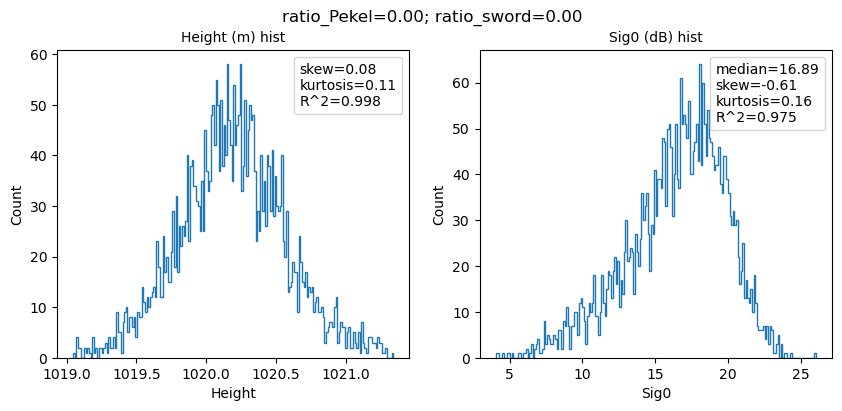

2026-02-06 16:38:16,505 [INFO] Ratio pekel, ratio sword: 0.30798479087452474, 0.0
2026-02-06 16:38:16,505 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):8.205073356628418, 0.11161358654499054, 0.4926445186138153, -0.18520832061767578, 2.308964729309082, 0.9982615193935988, 0.9731287554559864


Body type: LAND

Processing Label 46 / 64


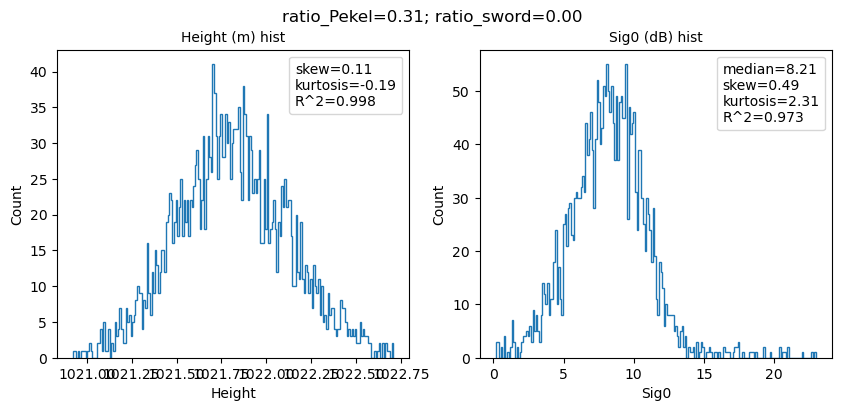

/work/scratch/env/stephag/.conda/envs/FPDEM_eodag_env/lib/python3.12/site-packages/osgeo/ogr.py:5960: RuntimeWarning: Self-intersection at or near point 22.902247462923953 -15.212912744159846
  return _ogr.Geometry_IsValid(self, *args)
2026-02-06 16:38:16,795 [INFO] Ratio pekel, ratio sword: 0.0, 0.0
2026-02-06 16:38:16,796 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):16.154653549194336, -0.07796245813369751, -0.5116391181945801, 0.05766415596008301, -0.14129185676574707, 0.9983171772823441, 0.9789553040724489


Body type: WATER
Bathtub ring method is applied

Processing Label 47 / 64


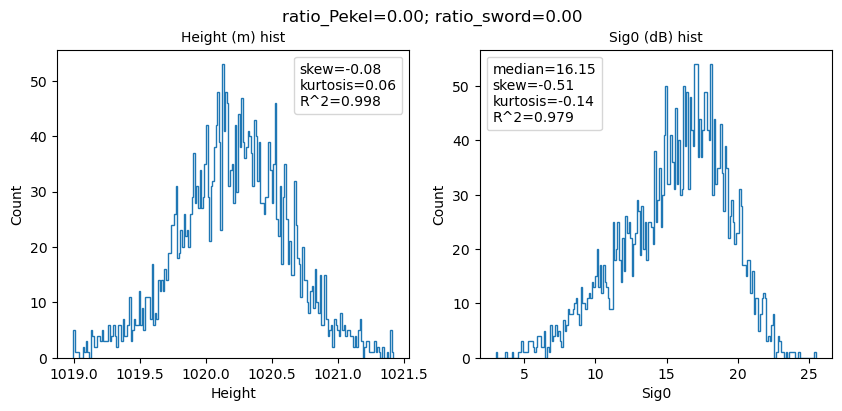

2026-02-06 16:38:17,118 [INFO] Ratio pekel, ratio sword: 0.033003505071497255, 0.0
2026-02-06 16:38:17,119 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.83248233795166, 0.03054293990135193, 0.5098066329956055, -0.23053574562072754, 2.1508665084838867, 0.9987553713356283, 0.9739334807942334


Body type: LAND

Processing Label 48 / 64


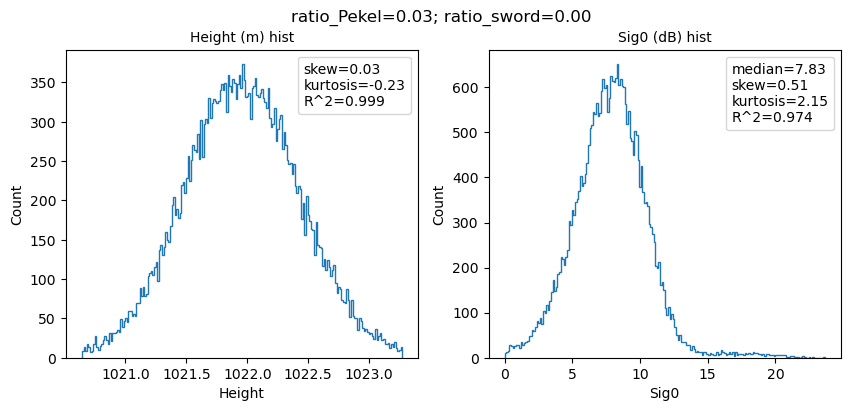

2026-02-06 16:38:17,471 [INFO] Ratio pekel, ratio sword: 0.8227505080987867, 0.5136724764426926
2026-02-06 16:38:17,472 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):17.12673568725586, -0.14831317961215973, -0.6262866258621216, -0.8057584762573242, 0.02377939224243164, 0.9838147866378149, 0.9700980667614362


Body type: LAND

Processing Label 49 / 64


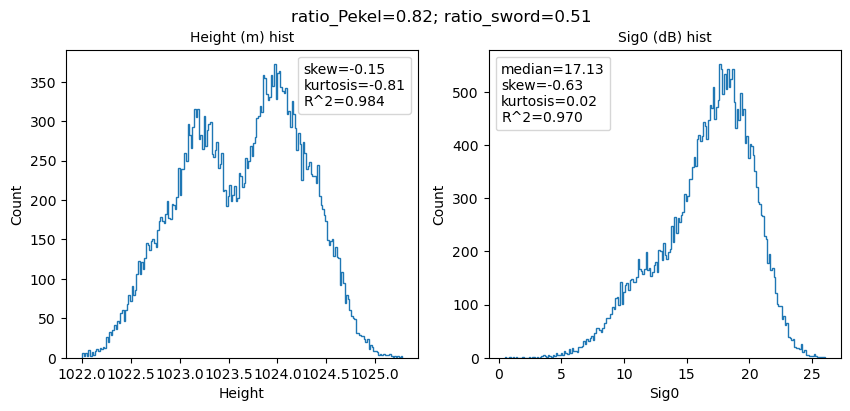

Body type: WATER
Bathtub ring method is applied


/work/scratch/env/stephag/.conda/envs/FPDEM_eodag_env/lib/python3.12/site-packages/osgeo/ogr.py:5960: RuntimeWarning: Self-intersection at or near point 22.938015019105368 -15.183358764414177
  return _ogr.Geometry_IsValid(self, *args)
2026-02-06 16:38:19,019 [INFO] Ratio pekel, ratio sword: 0.5158254918733961, 0.0
2026-02-06 16:38:19,020 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):9.518250465393066, 0.09974806010723114, 0.9525355100631714, 0.3850390911102295, 0.015952587127685547, 0.9913889696036505, 0.9005958393906613



Processing Label 50 / 64


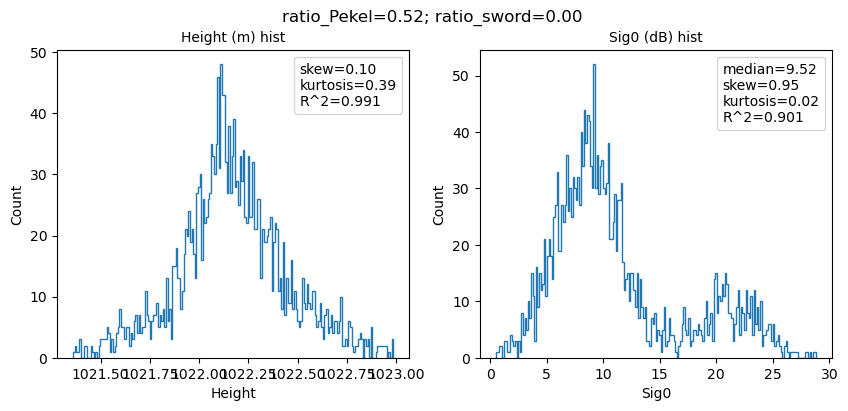

Body type: WATER_LAND
Clustering method is applied
    Azimuth/Range extrema:  lat  1886 1985 -- lon  1626 1787


2026-02-06 16:38:19,401 [INFO]     Normalizing the 4 parameters (lon, lat, h, sig0) for clustering


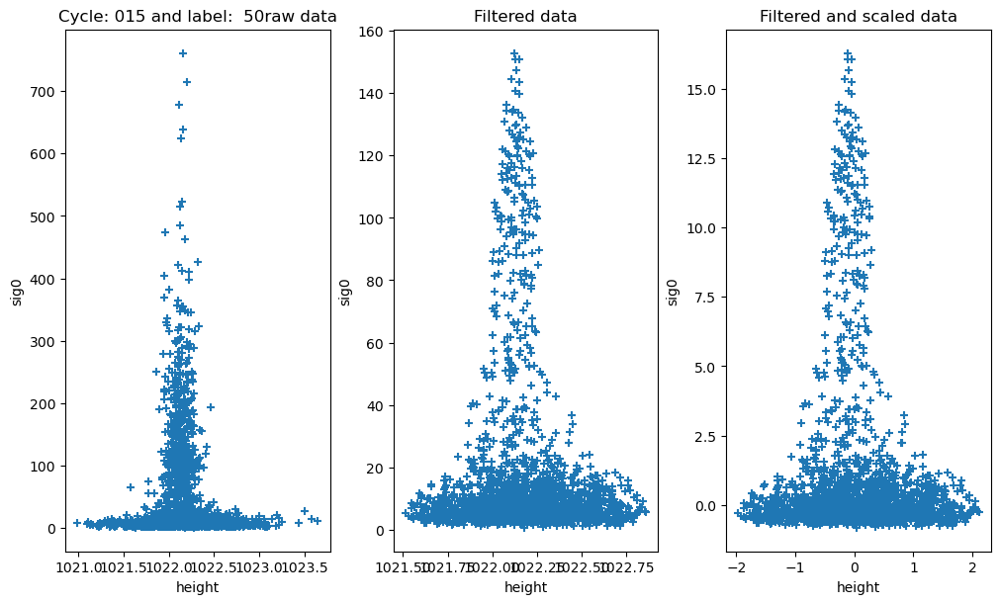

label_present [np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14), np.int64(15), np.int64(16), np.int64(17), np.int64(-1)]


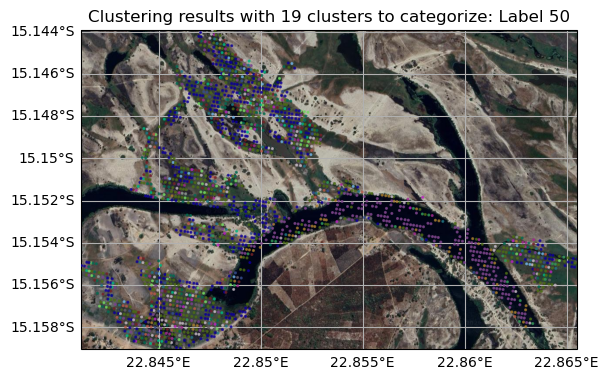

2026-02-06 16:38:24,471 [INFO]     Get the labels for soil and for water
2026-02-06 16:38:24,509 [INFO] Ratio pekel, ratio sword: 0.4126637554585153, 0.0
2026-02-06 16:38:24,510 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.407986640930176, 0.3396250903606415, -0.2055792212486267, -0.8465511798858643, -0.07065224647521973, 0.9666871074502104, 0.9935265038600116
2026-02-06 16:38:24,544 [INFO] Ratio pekel, ratio sword: 0.3829787234042553, 0.0
2026-02-06 16:38:24,545 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):10.462923049926758, 0.06710227578878403, 0.21286951005458832, -0.6387274265289307, -1.1559685468673706, 0.9901934918553263, 0.9521710457313058
2026-02-06 16:38:24,577 [INFO] Ratio pekel, ratio sword: 0.275, 0.0
2026-02-06 16:38:24,577 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):10.490226745605469, 0.118435144

label_present [np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14), np.int64(15), np.int64(16), np.int64(17), np.int64(-1)]


2026-02-06 16:38:24,683 [INFO] Ratio pekel, ratio sword: 0.6538461538461539, 0.0
2026-02-06 16:38:24,684 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):9.22384262084961, 0.05902879312634468, -0.16166827082633972, -0.5735812187194824, -0.5915026664733887, 0.9662712312190781, 0.979058213450705
2026-02-06 16:38:24,718 [INFO] Ratio pekel, ratio sword: 0.45901639344262296, 0.0
2026-02-06 16:38:24,719 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):8.296731948852539, -0.09622881561517715, -0.5119357109069824, -0.6909682750701904, -0.2388925552368164, 0.9895324163660253, 0.972899782618375
2026-02-06 16:38:24,753 [INFO] Ratio pekel, ratio sword: 0.9148936170212766, 0.0
2026-02-06 16:38:24,754 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):19.781007766723633, -0.12754149734973907, -0.4252321720123291, -0.46596789360046387, -1.0187

    water_body_type:  {'LAND': [0, 1, 2, 3, 4, 5, 6, 9, 10, 11, 14, 15, 16, 17], 'WATER': [7, 8, 12, 13]}


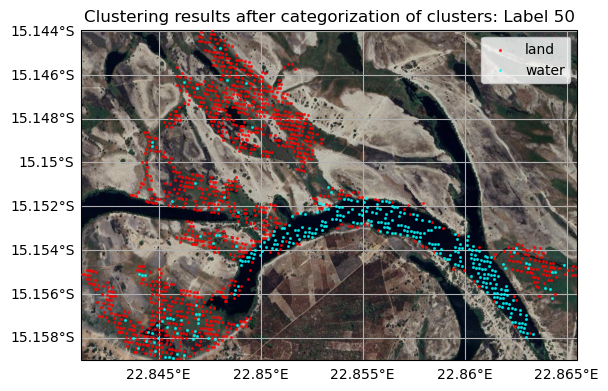

2026-02-06 16:38:25,983 [INFO] Ratio pekel, ratio sword: 0.0051740357478833494, 0.0
2026-02-06 16:38:25,984 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.484151840209961, -0.033801089972257614, 0.057523127645254135, -0.1474473476409912, 0.6095600128173828, 0.9989075407968352, 0.9929590790219999



Processing Label 51 / 64


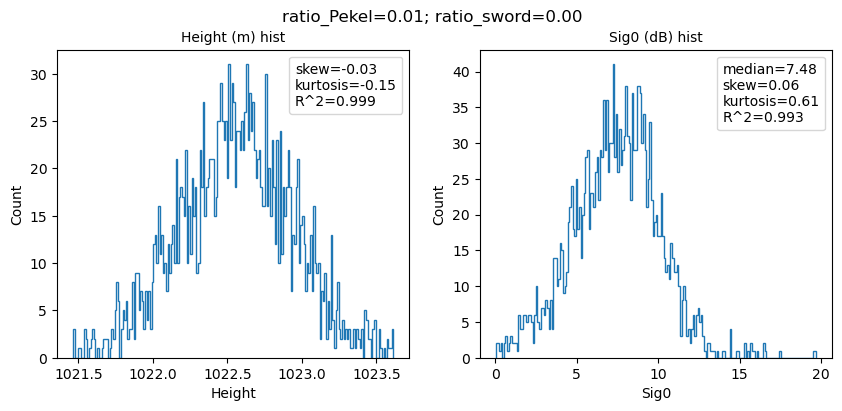

2026-02-06 16:38:26,254 [INFO] Ratio pekel, ratio sword: 0.0032267527134056907, 0.0
2026-02-06 16:38:26,254 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.600638389587402, -0.02880711667239666, -0.23511409759521484, -0.37148499488830566, 0.1311788558959961, 0.9975953626515175, 0.9937668351374208


Body type: LAND

Processing Label 52 / 64


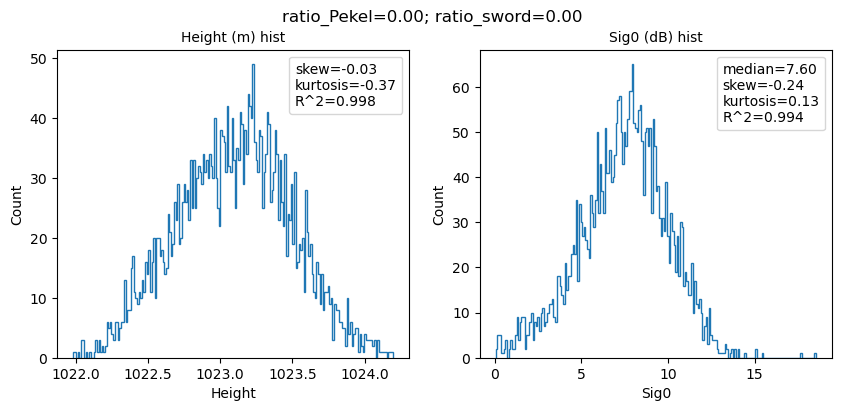

2026-02-06 16:38:26,521 [INFO] Ratio pekel, ratio sword: 0.11159387148410702, 0.0
2026-02-06 16:38:26,522 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):8.006799697875977, 0.11934676021337509, 1.2691940069198608, -0.10655879974365234, 3.3777589797973633, 0.9978862207574981, 0.9159369510684052


Body type: LAND

Processing Label 53 / 64


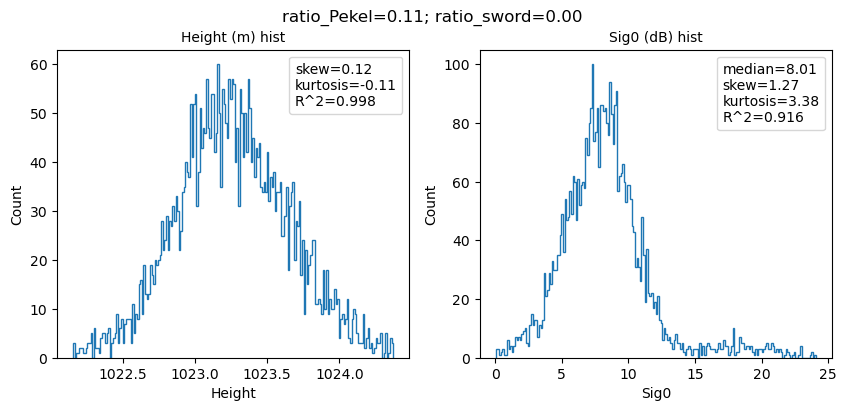

Body type: WATER_LAND
Clustering method is applied
    Azimuth/Range extrema:  lat  2220 2330 -- lon  2255 2496


2026-02-06 16:38:26,909 [INFO]     Normalizing the 4 parameters (lon, lat, h, sig0) for clustering


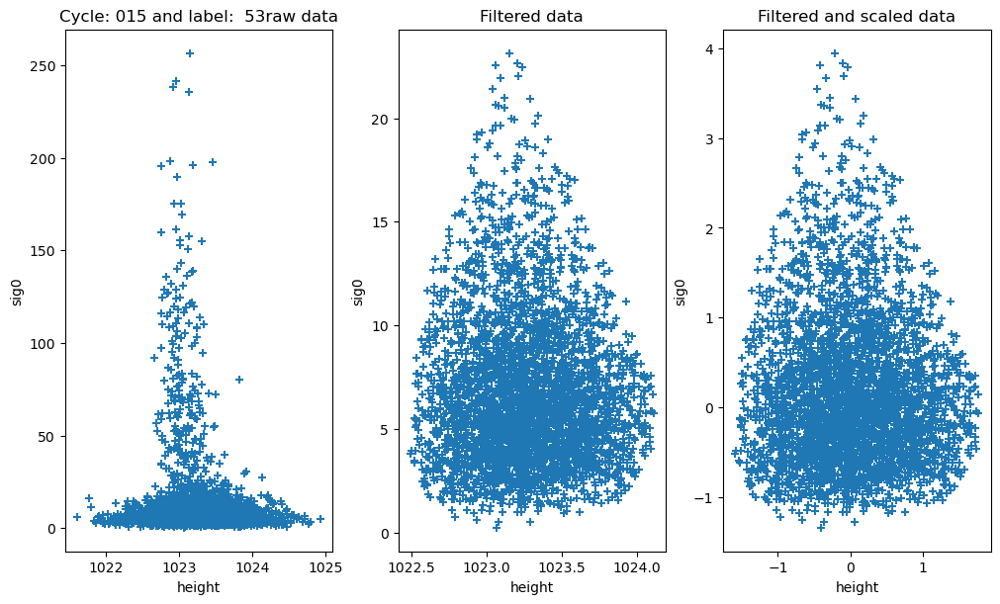

label_present [np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14), np.int64(15), np.int64(16), np.int64(17), np.int64(-1)]


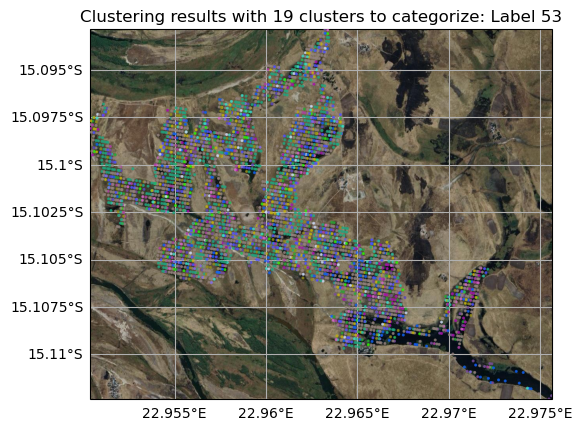

2026-02-06 16:38:36,508 [INFO]     Get the labels for soil and for water
2026-02-06 16:38:36,545 [INFO] Ratio pekel, ratio sword: 0.10526315789473684, 0.0
2026-02-06 16:38:36,546 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):10.45501708984375, -0.1380295306444168, -0.14769834280014038, -0.9140365123748779, -1.075629711151123, 0.9800538323146801, 0.9711031170646589
2026-02-06 16:38:36,584 [INFO] Ratio pekel, ratio sword: 0.08945686900958466, 0.0
2026-02-06 16:38:36,586 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):6.969515323638916, 0.41657695174217224, -0.4529453217983246, -0.7243492603302002, -0.1713731288909912, 0.9674334526743308, 0.9787795039674725
2026-02-06 16:38:36,632 [INFO] Ratio pekel, ratio sword: 0.06060606060606061, 0.0
2026-02-06 16:38:36,632 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):4.80968666076660

label_present [np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14), np.int64(15), np.int64(16), np.int64(17), np.int64(-1)]


2026-02-06 16:38:36,747 [INFO] Ratio pekel, ratio sword: 0.12883435582822086, 0.0
2026-02-06 16:38:36,747 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):9.994789123535156, 0.3656945526599884, 0.3750927150249481, -1.1181625127792358, -0.31231212615966797, 0.9364311532822591, 0.9847355790031358
2026-02-06 16:38:36,784 [INFO] Ratio pekel, ratio sword: 0.1958041958041958, 0.0
2026-02-06 16:38:36,785 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):11.947248458862305, 0.44343721866607666, 0.14561393857002258, -0.2341625690460205, -0.8776912689208984, 0.9799087761710267, 0.9751911596750724
2026-02-06 16:38:36,822 [INFO] Ratio pekel, ratio sword: 0.15, 0.0
2026-02-06 16:38:36,823 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):11.189820289611816, 0.5260929465293884, 0.8405404090881348, -0.5137712955474854, 0.7846782207489014, 0.95

    water_body_type:  {'LAND': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17], 'WATER': []}


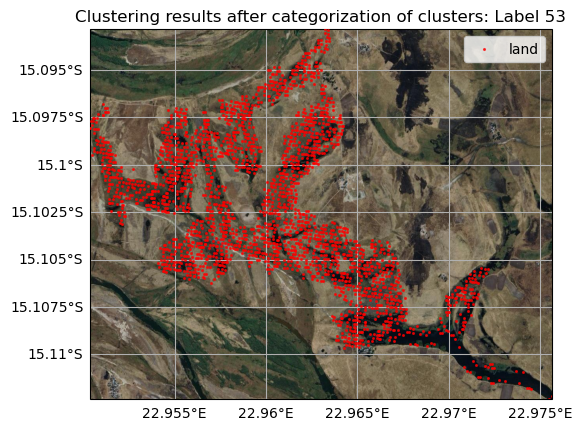

2026-02-06 16:38:37,907 [INFO] Ratio pekel, ratio sword: 0.02951240376390077, 0.0
2026-02-06 16:38:37,908 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.616705417633057, 0.007688509300351143, -0.0966813936829567, -0.2190227508544922, -0.14713096618652344, 0.9985592294616693, 0.9965999304837821



Processing Label 54 / 64


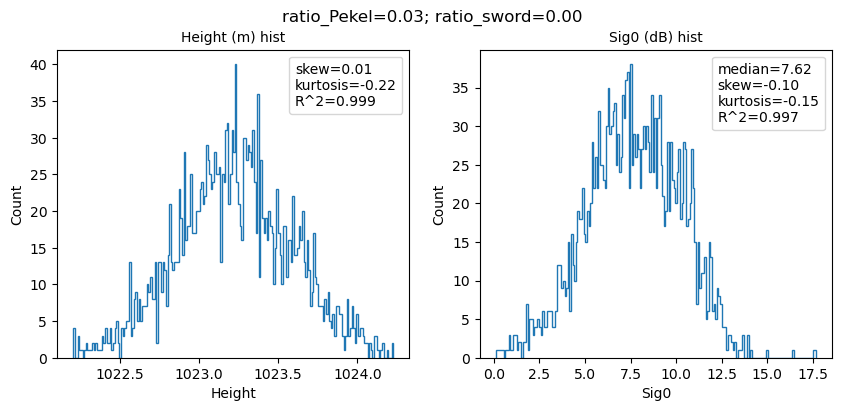

2026-02-06 16:38:38,193 [INFO] Ratio pekel, ratio sword: 0.017857142857142856, 0.0
2026-02-06 16:38:38,194 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):8.456539154052734, -0.059650957584381104, 0.21063567698001862, -0.22001385688781738, 1.3136472702026367, 0.9984937262198864, 0.9885642008607913


Body type: LAND

Processing Label 55 / 64


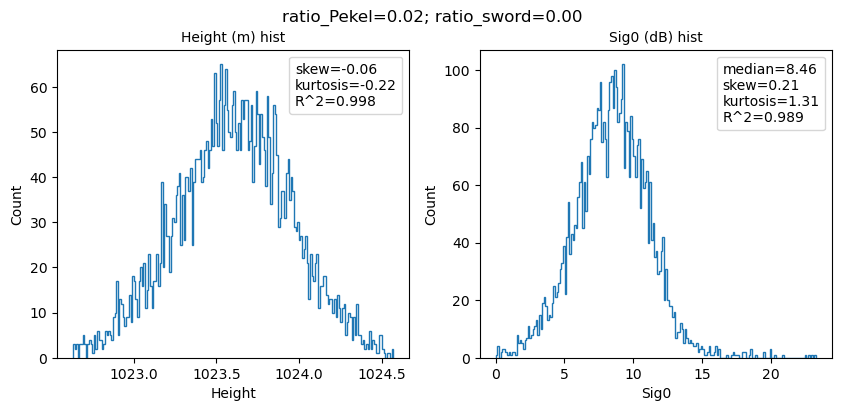

2026-02-06 16:38:38,456 [INFO] Ratio pekel, ratio sword: 0.7029733959311424, 0.0
2026-02-06 16:38:38,456 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.464053630828857, 0.061462439596652985, 0.06692902743816376, 0.06696319580078125, -0.1854703426361084, 0.998222411899422, 0.9983565974630225


Body type: LAND

Processing Label 56 / 64


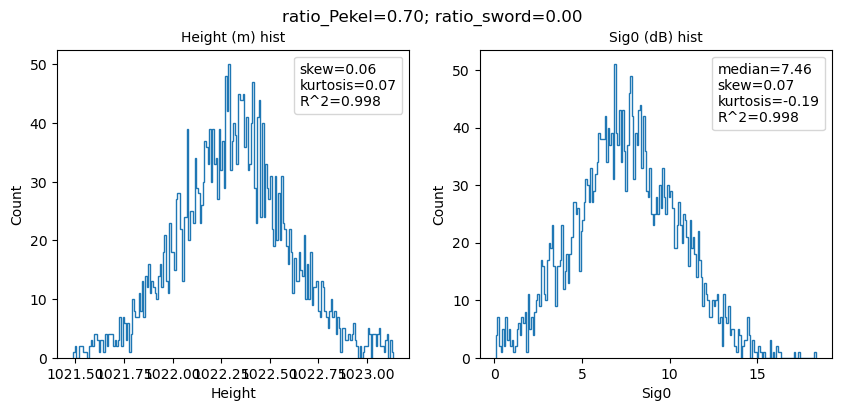

2026-02-06 16:38:38,771 [INFO] Ratio pekel, ratio sword: 0.042020046260601386, 0.0
2026-02-06 16:38:38,772 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):8.400248527526855, -0.060686539858579636, 0.7518649101257324, -0.2615032196044922, 2.0508475303649902, 0.9984305817262016, 0.965456888483761


Body type: WATER
Bathtub ring method is applied

Processing Label 57 / 64


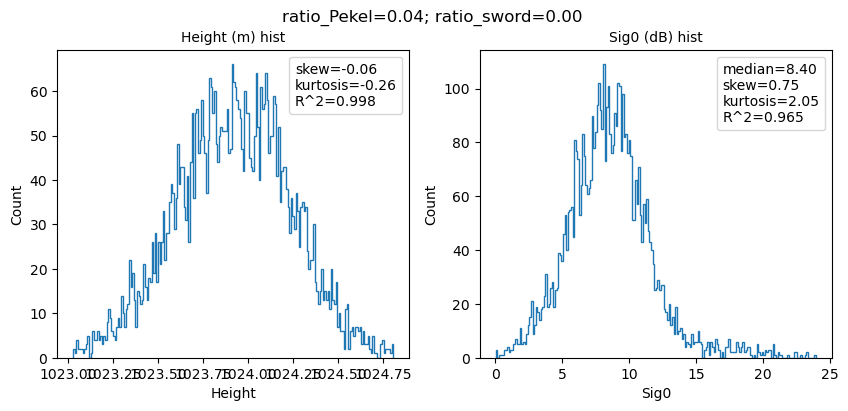

2026-02-06 16:38:39,046 [INFO] Ratio pekel, ratio sword: 0.027237354085603113, 0.0
2026-02-06 16:38:39,046 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.8852739334106445, 0.10745379328727722, 0.19138911366462708, 0.11634278297424316, 0.6971855163574219, 0.9968532440077932, 0.9927527845753203


Body type: LAND

Processing Label 58 / 64


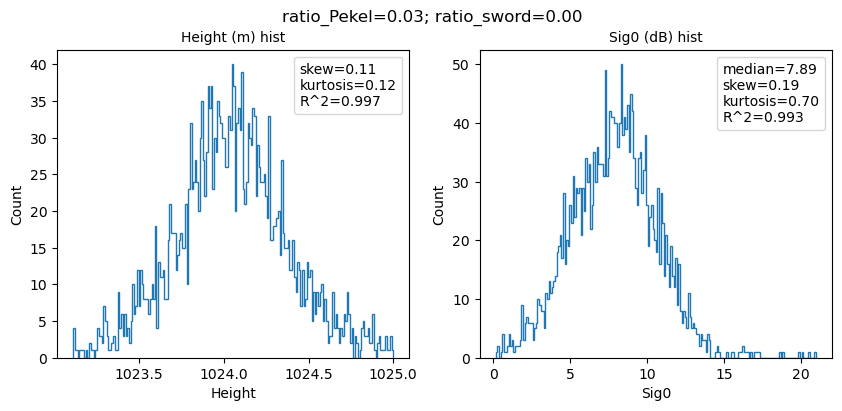

2026-02-06 16:38:39,320 [INFO] Ratio pekel, ratio sword: 0.017323369565217392, 0.0
2026-02-06 16:38:39,320 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.047717094421387, 0.10675564408302307, -0.2116287350654602, -0.2536427974700928, -0.24960756301879883, 0.9980844030045802, 0.9946181865028352


Body type: LAND

Processing Label 59 / 64


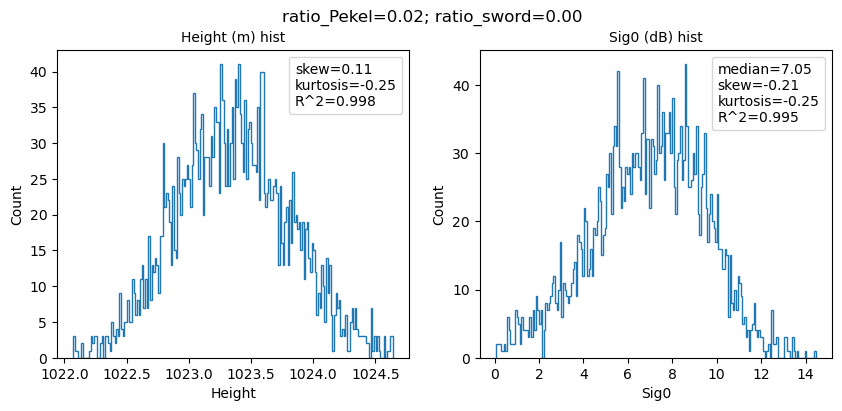

2026-02-06 16:38:39,624 [INFO] Ratio pekel, ratio sword: 0.7764215314632297, 0.0
2026-02-06 16:38:39,624 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.18635368347168, -0.04344213008880615, -0.09196971356868744, -0.02251291275024414, -0.33942127227783203, 0.9987851979603684, 0.997297278203835


Body type: LAND

Processing Label 60 / 64


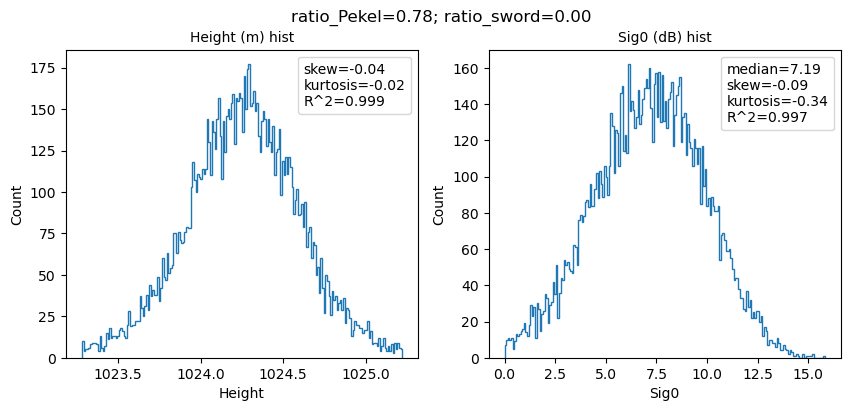

Body type: WATER
Bathtub ring method is applied


/work/scratch/env/stephag/.conda/envs/FPDEM_eodag_env/lib/python3.12/site-packages/osgeo/ogr.py:5960: RuntimeWarning: Self-intersection at or near point 22.887150080050002 -14.998822711956114
  return _ogr.Geometry_IsValid(self, *args)
2026-02-06 16:38:40,266 [INFO] Ratio pekel, ratio sword: 0.009385351490614648, 0.0
2026-02-06 16:38:40,266 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):7.2607927322387695, 0.21324372291564941, -0.07315628230571747, 0.5889251232147217, -0.04749131202697754, 0.9950632585896856, 0.9966300394744468



Processing Label 61 / 64


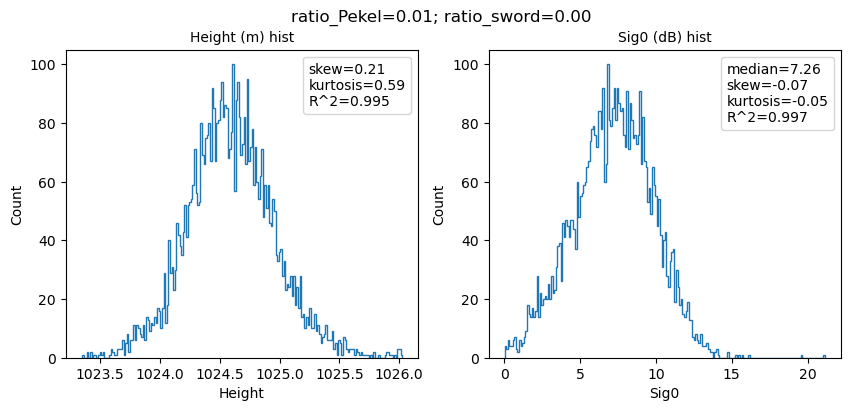

2026-02-06 16:38:40,531 [INFO] Ratio pekel, ratio sword: 0.2114065180102916, 0.0
2026-02-06 16:38:40,532 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):6.906864166259766, -0.07095729559659958, -0.05163144692778587, -0.08640289306640625, -0.2866785526275635, 0.9988646059167958, 0.9980228374626244


Body type: LAND

Processing Label 62 / 64


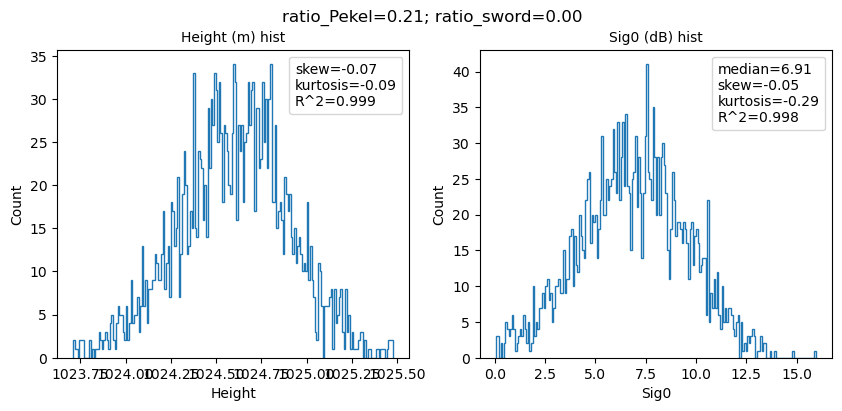

2026-02-06 16:38:40,848 [INFO] Ratio pekel, ratio sword: 0.9474926253687316, 0.9386430678466077
2026-02-06 16:38:40,849 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):14.873961448669434, -0.012236885726451874, -0.1963825672864914, 0.39734315872192383, -0.6132979393005371, 0.9957300713333425, 0.9889564899667176


Body type: WATER
Bathtub ring method is applied

Processing Label 63 / 64


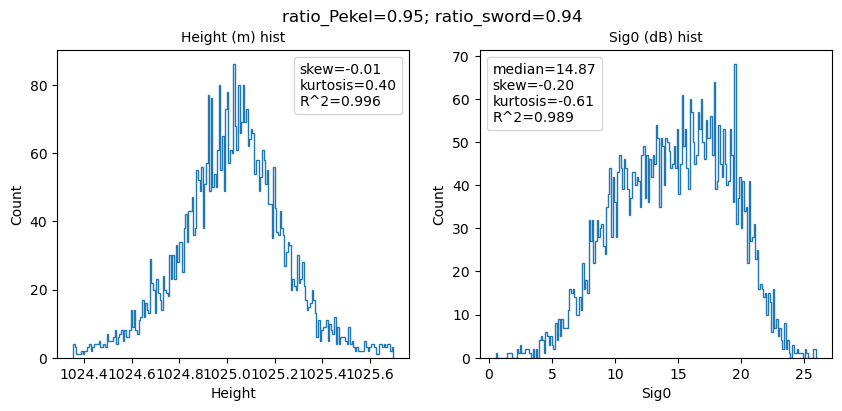

2026-02-06 16:38:41,176 [INFO] Ratio pekel, ratio sword: 0.1659919028340081, 0.0
2026-02-06 16:38:41,177 [INFO] Normality parameters (median_sig0, skew_h, skew_sig0, kurtosis_h, kurtosis_sig0, R²_h, R²_sig0):6.5006208419799805, 0.03911904618144035, -0.12044807523488998, -0.16325783729553223, -0.39460229873657227, 0.9990151695410233, 0.9956478300058934


Body type: WATER
Bathtub ring method is applied

Processing Label 64 / 64


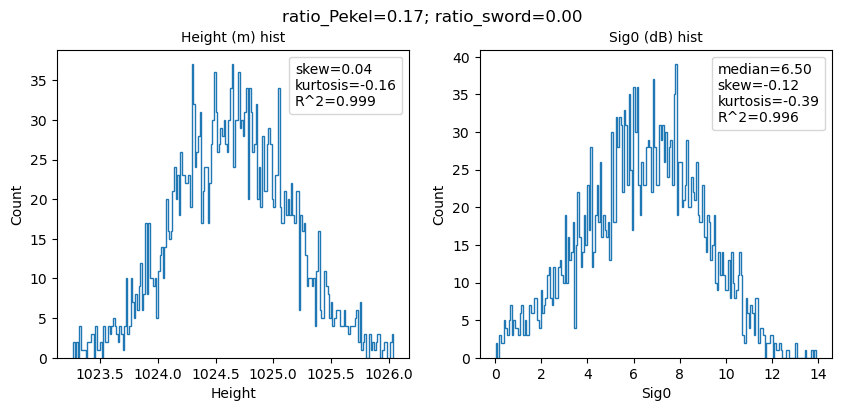

Body type: LAND


In [ ]:
# Load class FloodPlain, necessary for access to bathtub ring subroutine
fpdem = Floodplain(None)

# Initialize main FPDEM dataframe
fpdem_land = pd.DataFrame()

# Loop over all PIXC files
for ip, pixc_file in enumerate(inputpixcfiles):
    
    print(f"Processing PIXC {ip+1}/{len(inputpixcfiles)}")
    
    cycle = os.path.basename(pixc_file)[16:19]
    if os.path.isdir(os.path.join(output_dir, f'cycle{cycle}')) is False:
        os.mkdir(os.path.join(output_dir, f'cycle{cycle}'))
    
    # Get PIXCVec file (currently not used at all -- commented lines in floodplain/io/nc.py)
    vec_file = inputvecfiles[ip]
    # Load PixcReader class, and read pixc file
    pixc_reader = PixcReader(polygon_mask, pixc_file, vec_file)

    # Pre-processing of PIXC: extract water points (classification > 2), exclude near-range points, 
    # and clusters whose area is smaller than the given threshold
    water, min_range_ind_to_remove = pre_processing_pixc(pixc_reader, 
                                                         cross_track_min, threshold, 
                                                         sig0_qual)

    # Select only points of classification 3, 4 and some 5 if in Pekel mask 95%-100%,
    # remove all isolated points if some remains in pre-processing,
    # and define clusters / label the detected water bodies
    label_tab, count, classification_tab, \
               height_tab, sig0_tab, \
               azimuth_index_tab, range_index_tab, \
               latitude_tab, \
               longitude_tab = compute_label_and_remove_small_object(water,
                                                                     pixc_reader.range_size, pixc_reader.azimuth_size,
                                                                     pekel_X_100_poly,
                                                                     body_min_size, body_connectivity, 
                                                                     plot=plot, outpath=output_dir, cycle=cycle)
    print(f"Number of water bodies found : {count}")
    
    # Initialize selected PIXC FPDEM dataframe
    fpdem_land_pixc = pd.DataFrame()
    
    # Loop over all detected water bodies in the PIXC
    for label in range(1, count+1):
        
        print(f"\nProcessing Label {label} / {count}")
        
        # Return water_extract (-> GeoDataFrame), only points corresponding to the processed label
        water_extract = compute_subwater_extract_from_label(water, label_tab, 
                                                            azimuth_index_tab, range_index_tab, label)
        if len(water_extract) == 0:
            continue
        
        if approach == 'mixed':
            # TODO: Delete once the new PIXC products have corrected dark_water elevation
            #       At the moment the dark water height is too bad to be used in categorization of bodies
            # This geodataframe is used to parametrize the water body and select its type (land, water or land_water)
            water_extractCateg = water_extract[(water_extract.classification == 3) | 
                                               (water_extract.classification == 4)]
            if len(water_extractCateg) == 0:
                continue
                
            # Plot height and sig0
            if plot == 'yes':
                height_to_plot = np.where(label_tab == label, height_tab, 0)[l0:l1, c0:c1]
                height_to_plot[np.where(height_to_plot == 0)] = np.nan
                sig_to_plot = 10*np.log10(np.where(label_tab == label, sig0_tab, 0)[l0:l1, c0:c1])
                sig_to_plot[np.where(sig_to_plot == 0)] = np.nan
                fig, (ax, ax2) = plt.subplots(nrows=1, ncols=2, layout='constrained')
                ax.set_title("Height(m) for cycle: " + cycle + "-- label: " + str(label))
                im = ax.imshow(height_to_plot)
                fig.colorbar(im, shrink=0.5, ax=ax)
                ax2.set_title("Sig0 (dB)")
                im2 = ax2.imshow(sig_to_plot)
                fig.colorbar(im2, shrink=0.5, ax=ax2)
                plt.show()

            # Find the category the water body belongs to
            water_body_type, categ_params = find_body_category(water_extractCateg, pekel_0_100_poly, poly_sword, plot=plot)
            print(f"Body type: {water_body_type}")

            # Apply different method depending on body category
            # LAND => direct extraction
            # WATER => Bathtub ring method
            # WATER_LAND => clustering method
            #         LAND => direct extraction
            #         WATER => Bathtub ring method
            if water_body_type == "LAND":
                fpdem_land_pixc = pd.concat([fpdem_land_pixc, water_extract[['longitude', 'latitude',
                                                                               'height', 'sig0', 'classification',
                                                                               'azimuth_index', 'range_index']]])
                
            elif water_body_type == "WATER":
                print('Bathtub ring method is applied')
                res_bathtub = fpdem.compute_bathtub_method(water_extract)
                fpdem_land_pixc = pd.concat([fpdem_land_pixc, res_bathtub])
                
            elif water_body_type == "WATER_LAND":
                print('Clustering method is applied')
                
                # Over one cycle (selected or first one of the list) extract height 
                # to obtain range and azimuth extrema
                l0, l1, c0, c1 = get_range_azimuth_extrema(water_extract, 
                                                           pixc_reader.range_size, pixc_reader.azimuth_size)
            
                # Create 4D matrix with all variables used for clustering (h, sig0, lon, lat)
                sub_image = prepare_clustering_image(height_tab, sig0_tab, latitude_tab, longitude_tab,
                                                     label_tab, label, l0, l1, c0, c1)
                
                # Load class Clustering_Method and initialize its variables
                clust = Clustering_Method(sub_image, label, output_dir, cycle, plot=plot)
                
                # Filter outliers and normalize height and sig0
                clust.normalize_data(filter_method=clustering_outlier_filter_method) # isolation_forest/zscore
                
                if clustering_method == 'birch' or clustering_method == 'kmeans':
                    clust.clustering_method(method=clustering_method)
                elif clustering_method == 'hdbscan_tsne':
                    clust.tsne()
                    clust.clustering_tsne_hdbscan()
                else:
                    clust.umap()
                    clust.clustering_umap_hdbscan()
                
                # Categorize the different clusters into LAND or WATER
                clust.get_water_soil_labels(water_extract, pekel_0_100_poly, poly_sword)

                # For WATER cluster
                if clust.sub_img_labeled_water is not None:
                    geom = gpd.points_from_xy(clust.sub_img_labeled_water[:, 2], 
                                              clust.sub_img_labeled_water[:, 3])
                    water_extract_w = water_extract[water_extract.geometry.isin(geom)]
                    
                    if clustering_contour == 'bathtub':
                        res_bathtub = fpdem.compute_bathtub_method(water_extract_w)
                    elif clustering_contour == 'concavehull':
                        concave_hull = gpd.GeoSeries([MultiPoint(water_extract_w['geometry'].values)]).concave_hull(ratio=0.05,
                                                                                                                    allow_holes=True)
                        list_coords = shapely.get_coordinates(concave_hull.exterior).tolist()
                        res_bathtub = gpd.GeoDataFrame(geometry=[Point(i) for i in list_coords], crs=4326)
                        res_bathtub['longitude'] = pd.Series(res_bathtub.geometry.get_coordinates().x.values)
                        res_bathtub['latitude'] = pd.Series(res_bathtub.geometry.get_coordinates().y.values)
                        col_list = ['height', 'sig0', 'azimuth_index', 'range_index', 'classification']
                        res_bathtub[col_list] = res_bathtub.apply(find_attributes, args=(water, 2,), axis=1)
                        res_bathtub = res_bathtub.drop(['geometry'], axis=1)
                        
                    fpdem_land_pixc = pd.concat([fpdem_land_pixc, res_bathtub])
                    
                # For LAND cluster
                if clust.sub_img_labeled_land is not None:
                    geom = [Point(lon, lat) for lon, lat in zip(clust.sub_img_labeled_land[:, 2], 
                                                                clust.sub_img_labeled_land[:, 3])]
                    water_extract_l = water_extract[water_extract.geometry.isin(geom)]
                    fpdem_land_pixc = pd.concat([fpdem_land_pixc, water_extract_l[['longitude', 'latitude',
                                                                                    'height', 'sig0', 'classification',
                                                                                    'azimuth_index', 'range_index']]])

        elif approach == 'bathtub':
            res_bathtub = fpdem.compute_bathtub_method(water_extract)
            fpdem_land_pixc = pd.concat([fpdem_land_pixc, res_bathtub])

            
    # Remove borders points
    range_min = int(np.min(fpdem_land_pixc.range_index))
    range_max = int(np.max(fpdem_land_pixc.range_index))
    fpdem_land_pixc = remove_borders(fpdem_land_pixc.copy(), range_min, range_max-1,
                                     pixc_reader.azimuth_min, pixc_reader.azimuth_max-1,
                                     min_range_ind_to_remove)
    
    # Filter according to user defined lat-lon box
    try:
        fpdem_land_pixc = fpdem_land_pixc.loc[(fpdem_land_pixc['longitude'] > longitude_min) &
                                              (fpdem_land_pixc['longitude'] < longitude_max) &
                                              (fpdem_land_pixc['latitude'] > latitude_min) &
                                              (fpdem_land_pixc['latitude'] < latitude_max)]
    except:
        print('No filtering on latitude and longitude as none seems to be givven as inputs')
    
    # Add quality flags, time and elevation columns
    fpdem_land_pixc[['classification_qual', 'geolocation_qual',
                      'time', 'elevation']] = fpdem_land_pixc.apply(find_attributes, args=(water, 1,), axis=1)
    
    # Flag filtering (more could be added later on)
    fpdem_land_pixc = filter_data_based_on_quality_flag(fpdem_land_pixc, 
                                                        classification_qual, geolocation_qual)

    # Get utm coordinates
    lambdafunc = lambda row: pd.Series([*utm.from_latlon(row['latitude'], row['longitude'])[0:2], row['height']])
    fpdem_land_pixc[['x', 'y', 'z']] = fpdem_land_pixc.apply(lambdafunc, axis=1)
            
    # Merge all PIXC results
    fpdem_land = pd.concat([fpdem_land, fpdem_land_pixc])
        

In [13]:
# Transforming the Dataframe with all results into a GeoDataFrame
geom = gpd.points_from_xy(fpdem_land.longitude, fpdem_land.latitude)
fpdem_land = gpd.GeoDataFrame(fpdem_land, geometry=geom, crs=water.crs)

# Removing/filtering points (from Pekel if selected and isolated points)

1 - Remove all points if within Pekel occurrences >X2% (defined in parameter 'filtering_pekel_end_val' at the beginning of the code)

2 - Remove isolated points using DBSCAN

In [14]:
# Some final filtering on the FPDEM results
res_data = final_filtering_FPDEM_results(fpdem_land, filtering_pekel_end, pekel_X2_100_poly,
                                         distance_to_neighbors, number_of_neighbors, output_dir)

2026-01-28 13:28:09,492 [INFO] Remove isolated points
2026-01-28 13:28:12,032 [INFO]         54 points were removed
/work/scratch/env/stephag/.conda/envs/FPDEM_eodag_env/lib/python3.12/site-packages/pyproj/crs/crs.py:143: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
2026-01-28 13:28:16,560 [INFO] Created 322,032 records
2026-01-28 13:28:16,572 [INFO] The results of DBSCAN labeling were written in file "results_fpdem_labels_dbscan.shp" 


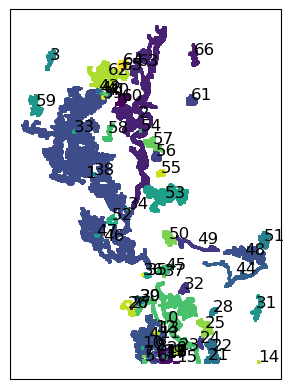

In [15]:
# Plot all clusters on which area extraction/polygonization will be performed
N_cluster = len(np.unique(res_data.lab_dbscan.values))
fig = plt.figure()
ax1 = fig.add_subplot(111, projection=tiler.crs)
cmap = plt.get_cmap('viridis')
colors = [cmap(i) for i in np.linspace(0, 1, N_cluster)]
random.shuffle(colors)
for k, color in enumerate(colors, start=0):
    res_data2 = res_data[res_data.lab_dbscan == k]
    ax1.scatter(res_data2.longitude.values, res_data2.latitude.values, c=np.array([color]), s=1)
    lon_avg = (np.min(res_data2.longitude) + np.max(res_data2.longitude)) / 2
    lat_avg = (np.min(res_data2.latitude) + np.max(res_data2.latitude)) / 2
    ax1.annotate(k, xy=(lon_avg, lat_avg), xycoords='data', color='black', fontsize=12)
plt.show()

# Plotting ungridded FPDEM results

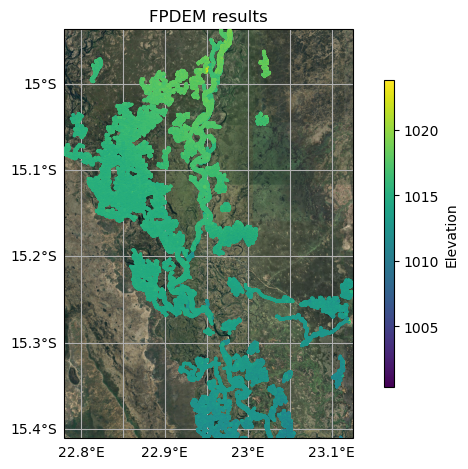

In [16]:
extent = [np.min(res_data.longitude.values), np.max(res_data.longitude.values), 
         np.min(res_data.latitude.values), np.max(res_data.latitude.values)]
hmin = min(res_data.elevation.values)
hmax = max(res_data.elevation.values)

fig = plt.figure(layout='tight')
ax = fig.add_subplot(1, 1, 1, projection=tiler.crs)
ax.set_title(f'FPDEM results')
ax.set_extent(extent, geodetic)
ax.add_image(tiler, 13)
cs = res_data.plot(ax=ax, kind='scatter', x='longitude', y='latitude', c="elevation", 
               zorder=5, transform=wgs84, s=1, vmin=hmin, vmax=hmax, colorbar=False)
sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=hmin, vmax=hmax))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, shrink=0.75, aspect=30, label='Elevation')
gl = ax.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False

plt.show()

# Write FPDEM ungridded file

In [17]:
fpdem.res_pointcloud = res_data
fpdem.inputpixcfiles = inputpixcfiles
fpdem.inputvecfiles = inputvecfiles
fpdem.output_path = output_dir
fpdem.tile_name = tile_name
fpdem.first_date_name = first_date
fpdem.last_date_name = last_date

In [18]:
fpdem.write_fpdem_pointcloud_output()

2026-01-28 13:28:21,882 [INFO] Writing the ungridded netcdf with FPDEM results
/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/src/toshp.py:37: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  'range_index', 'azimuth_index', 'time']].to_file(filename, driver=driver, schema=schema, crs=prj,
2026-01-28 13:28:31,242 [WARNING] Normalized/laundered field name: 'range_index' to 'range_inde'
2026-01-28 13:28:31,242 [WARNING] Normalized/laundered field name: 'azimuth_index' to 'azimuth_in'
2026-01-28 13:28:56,694 [INFO] Writing FPDEM pointcloud file
/work/scratch/env/stephag/.conda/envs/FPDEM_eodag_env/lib/python3.12/site-packages/osgeo/osr.py:410: FutureWarning: Neither osr.UseExceptions() nor osr.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(
2026-01-28 13:28:56,752 [INFO] Write output file: OK


# Extract Area : Get Polygons of the AOI for rasterization

In [ ]:
output_fpdem_pointcloud_name = compute_name(output_dir, FPDEM_POINTCLOUD_BASENAME, tile_name,
                                            first_date, last_date)
output_mask_name = os.path.join(output_dir, FPDEM_BASENAME + MASK_SUFFIX)

In [19]:
extract_area = Extract_Area(None, 
                            input_file=output_fpdem_pointcloud_name, 
                            output_file=output_mask_name, 
                            ch_ratio=plg_ch_ratio)

extract_area.ch_ratio = plg_ch_ratio
extract_area.output_path = output_dir

2026-01-28 13:28:57,341 [INFO] There are 67 clusters (on which to extract polygons for rasterization)


In [ ]:
extract_area.load_input_extract_area()
extract_area.extract_area_polygons()

# Rasterization

In [20]:
output_fpdem_raster_name = compute_name(output_dir, FPDEM_RASTER_BASENAME, tile_name,
                                        first_date, last_date)

In [21]:
fpdem_raster = FPDEM_Raster(None, 
                            input_file=output_fpdem_pointcloud_name, 
                            output_file=output_fpdem_raster_name, 
                            mask=output_mask_name)
fpdem_raster.resolution = raster_resolution
fpdem_raster.mode = raster_mode
fpdem_raster.plot = plot

         latitude  longitude    elevation  fpdem_ungridded_qual      time
index                                                                    
0      -15.315431  22.972309  1011.433899                   1.0  209719.0
1      -15.315414  22.972196  1011.436890                   1.0  209719.0
2      -15.315598  22.972100  1011.053040                   1.0  209719.0
3      -15.315786  22.972025  1010.819153                   1.0  209719.0
4      -15.315803  22.972137  1010.815918                   1.0  209719.0
...           ...        ...          ...                   ...       ...
322027 -14.962466  23.018924  1018.033875                   1.0  213725.0
322028 -14.962267  23.018921  1019.255798                   1.0  213725.0
322029 -14.962270  23.018938  1018.617981                   1.0  213725.0
322030 -14.962272  23.018953  1017.964355                   1.0  213725.0
322031 -14.962295  23.019103  1018.184509                   1.0  213725.0

[322032 rows x 5 columns]


2026-01-28 13:29:47,340 [INFO] The filtering (MAD, 3sigma) removed 2346 points out of 322032.
/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/scripts/process_raster.py:213: RuntimeWarning: Mean of empty slice
  dist_mean = np.nanmean(distances_filtered, axis=1)
/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/scripts/process_raster.py:214: RuntimeWarning: All-NaN slice encountered
  dist_min = np.nanmin(distances_filtered, axis=1)
/work/SWOT/swotdev/swotdev/stephag/floodplain_dem/scripts/process_raster.py:225: RuntimeWarning: invalid value encountered in divide
  z = np.nansum(elevation_tab / distances_filtered, axis=1) / np.nansum(1. / distances_filtered, axis=1)
/work/scratch/env/stephag/.conda/envs/FPDEM_eodag_env/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:2015: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/work/scratch/env/stephag/.conda/envs/FPDEM_eodag_env/lib/python3.12/site-packages/pyproj/

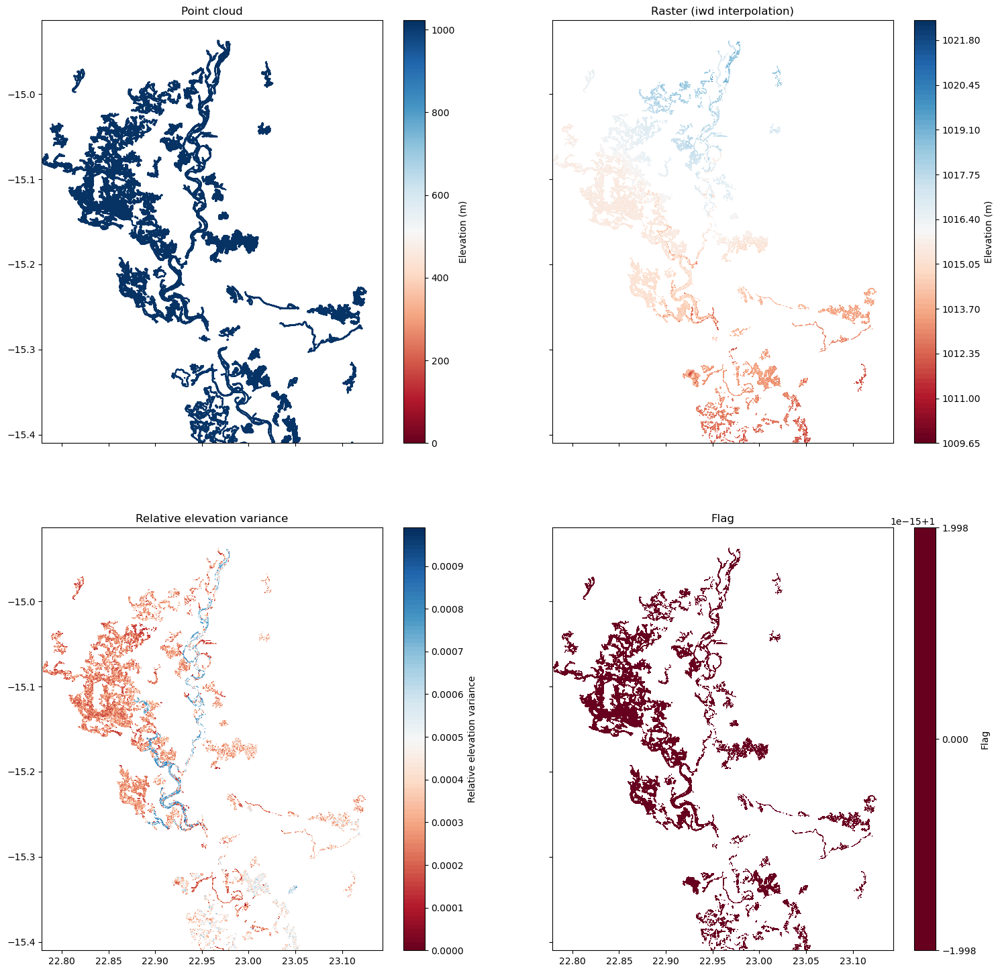

In [22]:
fpdem_raster.load_input_fpdem_raster()
fpdem_raster.compute_fpdem_raster()

In [23]:
fpdem_raster.write_fpdem_raster()

2026-01-28 13:30:06,951 [INFO] Writing FPDEM raster file
